#Exploratory Data Analysis and Feature Engineering

### Section 1 - Setup Environment

In [0]:
from pyspark.sql.functions import col, concat, count, countDistinct, expr, lit, length, max as pyspark_max, min as pyspark_min, mean, substring, split, sum as pyspark_sum, when, to_utc_timestamp, to_timestamp, unix_timestamp, isnan
import pandas as pd
from html import escape
from IPython.display import HTML, display as ipython_display
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql import SQLContext
from pyspark.sql.types import IntegerType, StringType, BooleanType, DateType, DoubleType
#from gcmap import GCMapper, Gradient
import matplotlib.pyplot as plt
from pandas.tseries.holiday import USFederalHolidayCalendar
from pyspark.sql.functions import substring
from pyspark.sql import functions as F


from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.sql.functions import col, max, substring
from pyspark.mllib.tree import DecisionTree, DecisionTreeModel
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import GBTClassifier
from pyspark.mllib.util import MLUtils

# from pandas.tseries.holiday import USFederalHolidayCalendar


In [0]:
blob_container = "w261-container" # The name of your container created in https://portal.azure.com
storage_account = "w261storageaccount" # The name of your Storage account created in https://portal.azure.com
secret_scope = "w261scope" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "w261key" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

### Section 2 - Load Data

In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


Next step is to prepare data and explore the features. In order to meet the business goal of this project, we will be using 4 datasets. We will start first with a smaller subset of around 3 months data from the weather and flights datasets in order to test the code and then apply the same funtions to the larger dataset at the end. 

The 4 datasets to be used here are:

1) **Airline dataset** - This is a subset of the passenger flight's on-time performance data taken from the TranStats data collection available from the U.S. Department of Transportation (DOT)

>  - The full dataset contains the entire flight data departing from all major US airports for the 2015-2019 timeframe.
>  - Q1 : For the first phase of the project we will focus on flights departing from two major US airports (ORD (Chicago O’Hare) and ATL (Atlanta) for the first quarter of 2015 (that is about 160k flights)

2) **Weather dataset** - the weather table contains weather data corresponding to the origin and destination airports at the time of departure and arrival respectively. This data is very important since the flight departures and arrivals often get affected by weather conditions.

> - The full weather data is for the period Jan 2015 - December 2019

3) **Stations dataset** - This table contains important features such as `station_id`, `distance_to_neighbor` and `neighbor_call`. This table does not have time-series data, hence there is no smaller subset to work on. However, this table will come very handy while joining flights table to another open airlines table that is described further in point 4.

4) **Airport dataset** - This is a public datset that has been used in his project for ICAO and IATA codes and Timezone of the U.S. airports.

The first 3 datasets were provided, and the forth one was deemed necessary to join the datasets.

So, let's start with loading the subset data and full data.

In [0]:
# Load the full airlines dataset
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data/*")

# Load full weather dataset
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2020-01-02T00:00:00.000")

# Load the stations dataset
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")

# Load 2015 Q1 for airlines dataset for ATL and ORD
df_airlines_3m = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/")

# Load the 2015 Q1 for Weather dataset
df_weather_3m = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2015-04-01T00:00:00.000")

# Load airport dataset
df_airport_codes = spark.read.csv(f"{blob_url}/US_icao_iata_timezone.csv", header=True, inferSchema= False)

# Print dataset sizes for both subset and full dataset
print(f'The Full airlines dataset has {df_airlines.count()} records and a total of {len(df_airlines.columns)} features')
print(f'The full weather dataset has {df_weather.count()} records and a total of {len(df_weather.columns)} features')
print(f'The stations dataset has {df_stations.count()} records and a total of {len(df_stations.columns)} features')
print(f'The Q1 2015 airlines dataset has {df_airlines_3m.count()} records and a total of {len(df_airlines_3m.columns)} features')
print(f'The Q1 2015 weather dataset has {df_weather_3m.count()} records and a total of {len(df_weather_3m.columns)} features')
print(f'The airport dataset has {df_airport_codes.count()} records and a total of {len(df_airport_codes.columns)} features')


The Full airlines dataset has 63493682 records and a total of 109 features
The full weather dataset has 630904436 records and a total of 177 features
The stations dataset has 5004169 records and a total of 12 features
The Q1 2015 airlines dataset has 161057 records and a total of 109 features
The Q1 2015 weather dataset has 29823926 records and a total of 177 features
The airport dataset has 7698 records and a total of 14 features

### Section 3 - Data Processing & EDA

#### Section 3.1 - Define helper functions

In [0]:
# Helper function 1:
def missing_values(helper_df, sort=False):
  """
  Helper funtion to count number of nulls and nans in each column
  """
  df = helper_df.select([F.count(F.when(F.isnan(c) | F.isnull(c), c)).alias(c) for (c,c_type) in helper_df.dtypes if c_type not in ('timestamp')]).toPandas()
  
  if len(df) == 0:
    print("There are no missing values")
    return None
  
  if sort:
    return df.rename(index={0: 'count'}).T.sort_values("count", ascending=False)
  
  return df

def get_data_stats_numerical(df, dependent_var=None):  
  """
  Function to get stats for numerical variables
  """
  
  obs = df.shape[0]
  data_types = df.dtypes
  counts = df.apply(lambda x: x.count())
  null_values = df.apply(lambda x: x.isnull().sum())
  distinct_values = df.apply(lambda x: x.unique().shape[0])
  missing_percent = (df.isnull().sum()/ obs) * 100
  skewness = df.skew()
  kurtosis = df.kurt() 
    
  corr = df.corr()[dependent_var]
  stats = pd.concat([data_types, counts, distinct_values, null_values, missing_percent, skewness, kurtosis, corr ], axis = 1, sort=False)
  corr_col = 'Corr_'  + dependent_var
  cols_numerical = ['Data Types', 'Counts', 'Distincts', 'Nulls', 'Missing %', 'Uniques', 'Kurtosis', corr_col ] # Do Skewness and Kurtosis only for numerical variables
    
  stats.columns = cols_numerical
  return stats  # Create DataFrame for printing 
  
def get_data_stats_categorical(df): 
  """
  Function to get stats for categorical variables
  """
  
  obs = df.shape[0]
  data_types = df.dtypes
    
  counts = df.apply(lambda x: x.count())
  
  null_values = df.apply(lambda x: x.isnull().sum())
  distinct_values = df.apply(lambda x: x.unique().shape[0])
  
  uniques = df.apply(lambda x: x.unique())
  missing_percent = (df.isnull().sum()/ obs) * 100
    
  stats = pd.concat([data_types, counts, distinct_values, null_values, missing_percent, uniques ], axis = 1, sort=False)
  
  cols = ['Data Types', 'Counts', 'Distincts', 'Nulls', 'Missing %', 'Uniques' ] # Do Uniques only for Categorical Variables 

  stats.columns = cols
  
  return stats  # Create DataFrame for printing

def get_data_stats(df): 
  """
  Function to get stats for all
  """
  
  obs = df.shape[0]
  data_types = df.dtypes
    
  counts = df.apply(lambda x: x.count())
  
  null_values = df.apply(lambda x: x.isnull().sum())
  distinct_values = df.apply(lambda x: x.unique().shape[0])
  
  uniques = df.apply(lambda x: x.unique())
  missing_percent = (df.isnull().sum()/ obs) * 100
    
  stats = pd.concat([data_types, counts, distinct_values, null_values, missing_percent, uniques ], axis = 1, sort=False)
  
  cols = ['Data Types', 'Counts', 'Distincts', 'Nulls', 'Missing %', 'Uniques' ] # Do Uniques only for Categorical Variables 

  stats.columns = cols
  
  return stats  # Create DataFrame for printing

def handleMissingValues(originalVal, missingVal):
  """
  A function to handle missing values
  """
  return when(originalVal != missingVal, originalVal).otherwise(lit(None))


#### Section 3.2 - Airline Dataset

Let's begin with flights table as this is the main table. The first step would be to understand the available features on the `parquet_airlines_data_3m`, along with the schema details.

In [0]:
# Selection of dataset (3 month vs full data) 
# change full_data = False for 3 month dataset

full_data = False

if(not full_data):
  df_airlines_eda = df_airlines_3m
else:
  df_airlines_eda = df_airlines
  
display(df_airlines_eda.limit(10))

print('Data overview')
df_airlines_eda.printSchema()

print('Columns overview')
#pd.DataFrame(df_airlines_eda.dtypes, columns = ['Column Name','Data type'])

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,

Data overview
root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: integer (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_AIRPORT_SEQ_ID: integer (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_SEQ_ID: integer (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_STATE_FIPS: integer (nullable = true)
-- DEST_STATE_NM: string (nullable = true)
-- DEST_WAC: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- WHEELS_ON: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- ARR_TIME: integer (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_DEL15: double (nullable = true)
-- ARR_DELAY_GROUP: integer (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- CANCELLED: double (nullable = true)
-- CANCELLATION_CODE: string (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_ARR_DELAY: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- DIV1_AIRPORT: string (nullable = true)
-- DIV1_AIRPORT_ID: integer (nullable = true)
-- DIV1_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV1_WHEELS_ON: integer (nullable = true)
-- DIV1_TOTAL_GTIME: double (nullable = true)
-- DIV1_LONGEST_GTIME: double (nullable = true)
-- DIV1_WHEELS_OFF: integer (nullable = true)
-- DIV1_TAIL_NUM: string (nullable = true)
-- DIV2_AIRPORT: string (nullable = true)
-- DIV2_AIRPORT_ID: integer (nullable = true)
-- DIV2_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV2_WHEELS_ON: integer (nullable = true)
-- DIV2_TOTAL_GTIME: double (nullable = true)
-- DIV2_LONGEST_GTIME: double (nullable = true)
-- DIV2_WHEELS_OFF: integer (nullable = true)
-- DIV2_TAIL_NUM: string (nullable = true)
-- DIV3_AIRPORT: string (nullable = true)
-- DIV3_AIRPORT_ID: integer (nullable = true)
-- DIV3_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV3_WHEELS_ON: integer (nullable = true)
-- DIV3_TOTAL_GTIME: double (nullable = true)
-- DIV3_LONGEST_GTIME: double (nullable = true)
-

Let's find the important features relative to target. This code only works for the 3 month dataset since we need to convert the dataset to a pandas dataframe, which doesn't scale when using the full data.

In [0]:
# find important features relative to target.
if(not full_data):
  df_airlines_eda_pd = df_airlines_eda.toPandas()
  
  # Find most important features relative to target
  print("Find most important features relative to target")
  corr = df_airlines_eda_pd.corr()
  corr.sort_values(["DEP_DELAY_NEW"], ascending = False, inplace = True)
  print(corr.DEP_DELAY_NEW)

Find most important features relative to target
DEP_DELAY_NEW 1.000000
DEP_DELAY 0.997906
ARR_DELAY_NEW 0.960563
ARR_DELAY 0.943158
DEP_DELAY_GROUP 0.926614
 ... 
DIV3_AIRPORT_ID NaN
DIV3_AIRPORT_SEQ_ID NaN
DIV3_WHEELS_ON NaN
DIV3_TOTAL_GTIME NaN
DIV3_LONGEST_GTIME NaN
Name: DEP_DELAY_NEW, Length: 71, dtype: float64

The correlation function help us find most important features related to our outcome variable `DEP_DELAY_NEW`.

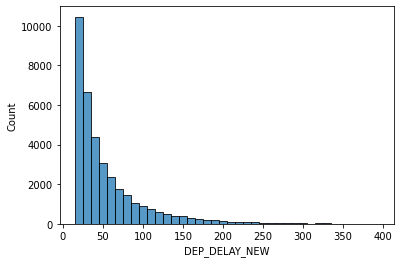

In [0]:
if(not full_data):
  df_airlines_eda_pd = df_airlines_eda.filter(col('DEP_DELAY_NEW') >= 15).filter(col('DEP_DELAY_NEW') < 400).toPandas()
  #df_airlines_eda_pd = df_airlines_eda.toPandas()
  sns.histplot(df_airlines_eda_pd['DEP_DELAY_NEW'], bins='40', binwidth=10);

The above graph shows a right-skewed data distribution, indicating that shorter delays are more frequent.

Let's generate descriptive statistics for `DEP_DELAY_NEW` and `ARR_DELAY_NEW`

In [0]:
# generate descriptive statistics for 'DEP_DELAY_NEW'

df_airlines_eda_pd['DEP_DELAY_NEW'].describe()

Out[80]: count 36587.000000
mean 54.296198
std 47.807286
min 15.000000
25% 23.000000
50% 37.000000
75% 67.000000
max 394.000000
Name: DEP_DELAY_NEW, dtype: float64

In [0]:
# generate descriptive statistics 'ARR_DELAY_NEW'

df_airlines_eda_pd['ARR_DELAY_NEW'].describe()

Out[81]: count 36358.000000
mean 50.972826
std 51.796456
min 0.000000
25% 17.000000
50% 34.000000
75% 67.000000
max 436.000000
Name: ARR_DELAY_NEW, dtype: float64

Let's plot the `DEP_DELAY_NEW` vs `DISTANCE`

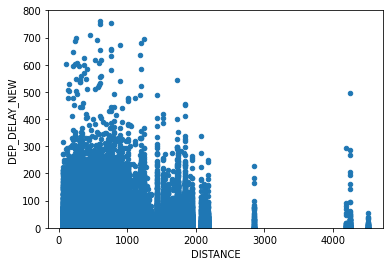

In [0]:
# plot 'DISTANCE' vs 'DEP_DELAY_NEW'
if(not full_data):
  df_airlines_clean_pd = df_airlines_eda.toPandas()
  var = 'DISTANCE'
  data = pd.concat([df_airlines_clean_pd['DEP_DELAY_NEW'], df_airlines_clean_pd[var]], axis=1)
  data.plot.scatter(x=var, y='DEP_DELAY_NEW', ylim=(0,800));


The above graph shows the relationship between Distance and Departure Delays. As we can observed, the mayority of the delays ocurr when the flights are less than 23,000 miles. 

Let's now count the number records for delayed ("1"), not-delay("0"), and null values of our outcome variable: 'DEP_DELAY_NEW'.

+---------+------+-------------------+
DEP_DEL15|COUNTS|PERCENTAGE_OF_TOTAL|
+---------+------+-------------------+
 0.0|119546| 74.22589517996734|
 1.0| 36685| 22.777650148705117|
 null| 4826| 2.9964546713275424|
+---------+------+-------------------+

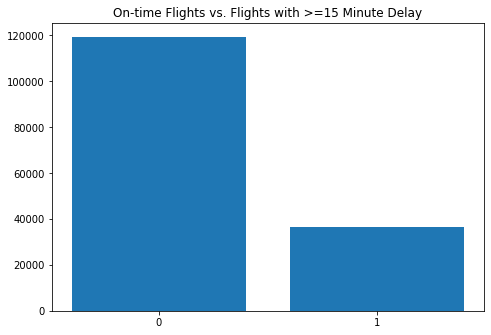

In [0]:
import numpy as np

# Count delayed vs. not-delayed vs. null values (table)
totalcount = df_airlines_eda.count()

df_airlines_eda_count = df_airlines_eda.groupBy("DEP_DEL15") \
  .count() \
  .withColumnRenamed('count', 'COUNTS') \
  .withColumn('PERCENTAGE_OF_TOTAL', (F.col('COUNTS') / totalcount) * 100 ) \
  .orderBy('COUNTS', ascending=False).show()



pdDF = df_airlines_eda.groupBy("DEP_DEL15").count().orderBy('count', ascending=False).toPandas()

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['On-Time', 'Delayed']
ax.bar(pdDF['DEP_DEL15'], pdDF['count'])
plt.xticks(np.arange(0, 2, step=1))
plt.title('On-time Flights vs. Flights with >=15 Minute Delay')
plt.show()


Looking at the above table, it clearly shows that 22% of flights get delayed leading to an imbalanced dataset.

Now, let's look at the numerical vs categorical data and find the relevance of features in the dataset. This will help us in feature selection from `flights` dataset.

**Numerical data**

In [0]:
if(not full_data):
  df_airlines_eda_pd = df_airlines_eda.toPandas()

  #Generate dataframe for numerical data
  numerical_data = [n for n in df_airlines_eda_pd.columns if df_airlines_eda_pd.dtypes[n] in ('float64','int32')]
  numerical_df = pd.DataFrame(df_airlines_eda_pd[numerical_data])

  # get stats for numerical variables
  pd.options.display.max_columns = None
  df_airlines_eda_details = get_data_stats_numerical(numerical_df, 'DEP_DEL15')
  display(HTML(df_airlines_eda_details.sort_values(by='Corr_DEP_DEL15', ascending=False).to_html()))

,Data Types,Counts,Distincts,Nulls,Missing %,Uniques,Kurtosis,Corr_DEP_DEL15
DEP_DEL15,float64,156231,3,4826,2.996455,1.251246,-0.434390,1.000000
ARR_DEL15,float64,155692,3,5365,3.331119,1.322230,-0.251711,0.747000
DEP_DELAY_GROUP,float64,156231,16,4826,2.996455,3.009204,10.675475,0.743691
ARR_DELAY_GROUP,float64,155692,16,5365,3.331119,2.718628,8.961963,0.678948
DEP_DELAY,float64,156231,474,4826,2.996455,6.185320,80.813129,0.656713
DEP_DELAY_NEW,float64,156231,452,4826,2.996455,6.487326,87.239685,0.643633
ARR_DELAY,float64,155692,525,5365,3.331119,5.207585,60.405954,0.624277
ARR_DELAY_NEW,float64,155692,462,5365,3.331119,6.360233,82.404482,0.584177
DIV_ARR_DELAY,float64,265,182,160792,99.835462,3.312048,15.476060,0.265971
LATE_AIRCRAFT_DELAY,float64,34915,301,126142,78.321340,3.569388,20.172870,0.230249


**Categorical data**

In [0]:
if(not full_data):
  # generate dataframe for categorical data
  categorical_data = [c for c in df_airlines_eda_pd.columns if df_airlines_eda_pd.dtypes[c] == 'object']
  categorical_df = pd.DataFrame(df_airlines_eda_pd[categorical_data])

  # get stats for categorical variables
  pd.options.display.max_columns = None 
  df_airlines_eda_details_categorical = get_data_stats_categorical(categorical_df)
  display(HTML(df_airlines_eda_details_categorical.to_html()))


,Data Types,Counts,Distincts,Nulls,Missing %,Uniques
FL_DATE,object,161057,90,0,0.000000,"[2015-02-01, 2015-02-02, 2015-02-03, 2015-02-04, 2015-02-05, 2015-02-06, 2015-02-08, 2015-02-09, 2015-02-10, 2015-02-11, 2015-02-12, 2015-02-13, 2015-02-15, 2015-02-16, 2015-02-17, 2015-02-18, 2015-02-19, 2015-02-20, 2015-02-22, 2015-02-23, 2015-02-24, 2015-02-25, 2015-02-26, 2015-02-27, 2015-02-07, 2015-02-14, 2015-02-21, 2015-02-28, 2015-01-01, 2015-01-02, 2015-01-03, 2015-01-04, 2015-01-05, 2015-01-06, 2015-01-07, 2015-01-08, 2015-01-09, 2015-01-10, 2015-01-11, 2015-01-12, 2015-01-13, 2015-01-14, 2015-01-15, 2015-01-16, 2015-01-17, 2015-01-18, 2015-01-19, 2015-01-20, 2015-01-21, 2015-01-22, 2015-01-23, 2015-01-24, 2015-01-25, 2015-01-26, 2015-01-27, 2015-01-28, 2015-01-29, 2015-01-30, 2015-01-31, 2015-03-01, 2015-03-02, 2015-03-03, 2015-03-04, 2015-03-05, 2015-03-06, 2015-03-07, 2015-03-08, 2015-03-09, 2015-03-10, 2015-03-11, 2015-03-12, 2015-03-13, 2015-03-14, 2015-03-15, 2015-03-16, 2015-03-17, 2015-03-18, 2015-03-19, 2015-03-20, 2015-03-21, 2015-03-22, 2015-03-23, 2015-03-24, 2015-03-25, 2015-03-26, 2015-03-27, 2015-03-28, 2015-03-29, 2015-03-30, 2015-03-31]"
OP_UNIQUE_CARRIER,object,161057,13,0,0.000000,"[AA, AS, B6, DL, EV, MQ, NK, OO, UA, US, VX, WN, F9]"
OP_CARRIER,object,161057,13,0,0.000000,"[AA, AS, B6, DL, EV, MQ, NK, OO, UA, US, VX, WN, F9]"
TAIL_NUM,object,160375,3908,682,0.423453,"[N3MEAA, N3LPAA, N3LXAA, N3LHAA, N3LYAA, N3LVAA, N3MAAA, N3MGAA, N3LTAA, N3LNAA, N3JDAA, N3LGAA, N3GHAA, N3KPAA, N3AXAA, N3EJAA, N3MFAA, N3AUAA, None, N3DCAA, N3LWAA, N3LLAA, N3BEAA, N3JTAA, N3EPAA, N3JWAA, N3LUAA, N3MDAA, N3MCAA, N3ETAA, N3LSAA, N3GRAA, N3ESAA, N3HGAA, N3BMAA, N3DRAA, N3GBAA, N3BLAA, N3ELAA, N3DVAA, N3KLAA, N3EUAA, N3AAAA, N3HJAA, N3DLAA, N3DYAA, N3JEAA, N3HRAA, N3CEAA, N3JRAA, N3EAAA, N3JUAA, N3AEAA, N3KCAA, N3HNAA, N3FYAA, N3FLAA, N3BKAA, N3GLAA, N3BSAA, N3DXAA, N3CTAA, N3HWAA, N3EHAA, N3LKAA, N3HMAA, N3DMAA, N3LRAA, N3BPAA, N3JJAA, N3LJAA, N3LEAA, N3CHAA, N3KKAA, N3ERAA, N3GDAA, N3DUAA, N3BCAA, N3BGAA, N3KVAA, N3FVAA, N3FRAA, N3FBAA, N3ATAA, N3KNAA, N3FMAA, N3BYAA, N3JVAA, N3BWAA, N3FGAA, N3DWAA, N3FSAA, N3KAAA, N3MBAA, N3ADAA, N3LDAA, N3LCAA, N3JYAA, N3GCAA, N3GEAA, ...]"
ORIGIN,object,161057,2,0,0.000000,"[ORD, ATL]"
ORIGIN_CITY_NAME,object,161057,2,0,0.000000,"[Chicago, IL, Atlanta, GA]"
ORIGIN_STATE_ABR,object,161057,2,0,0.000000,"[IL, GA]"
ORIGIN_STATE_NM,object,161057,2,0,0.000000,"[Illinois, Georgia]"
DEST,object,161057,192,0,0.000000,"[LGA, SJU, SAN, MIA, FLL, DCA, EGE, DFW, SJC, SEA, BOS, CLT, SFO, RSW, LAX, DEN, PDX, SNA, LAS, PSP, PBI, JFK, SLC, MEM, IAH, BNA, BHM, IAD, SAT, AUS, GRR, MSP, RDU, MCO, DTW, ORD, ATL, STT, PHX, LEX, TLH, CRW, MKE, BDL, OKC, MOB, PIT, MHT, DAB, EYW, OMA, ROC, MDW, MSY, RIC, CVG, IND, SDF, HOU, ICT, JAN, SAV, BUF, JAX, CAK, STL, GSO, CAE, GSP, PNS, ORF, TUS, MCI, CMH, SRQ, XNA, SMF, TPA, CHA, TYS, LFT, TRI, TUL, GNV, HSV, SHV, ILM, CHO, ABE, LIT, BWI, CHS, CLE, AGS, PHL, ALB, DAY, DSM, MYR, ECP, ...]"
DEST_CITY_NAME,object,161057,188,0,0.000000,"[New York, NY, San Juan, PR, San Diego, CA, Miami, FL, Fort Lauderdale, FL, Washington, DC, Eagle, CO, Dallas/Fort Worth, TX, San Jose, CA, Seattle, WA, Boston, MA, Charlotte, NC, San Francisco, CA, Fort Myers, FL, Los Angeles, CA, Denver, CO, Portland, OR, Santa Ana, CA, Las Vegas, NV, Palm Springs, CA, West Palm Beach/Palm Beach, FL, Salt Lake City, UT, Memphis, TN, Houston, TX, Nashville, TN, Birmingham, AL, San Antonio, TX, Austin, TX, Grand Rapids, MI, Minneapolis, MN, Raleigh/Durham, NC, Orlando, FL, Detroit, MI, Chicago, IL, Atlanta, GA, Charlotte Amalie, VI, Phoenix, AZ, Lexington, KY, Tallahassee, FL, Charleston/Dunbar, WV, Milwaukee, WI, Hartford, CT, Oklahoma City, OK, Mobile, AL, Pittsburgh, PA, Manchester, NH, Daytona Beach, FL, Key West, FL, Omaha, NE, Rochester, NY, New Orleans, LA, Richmond, VA, Cincinnati, OH, Indianapolis, IN, Louisville, KY, Wichita, KS, Jackson/Vicksburg, MS, Savannah, GA, Buffalo, NY, Jacksonville, FL, Akron

**Handle Missing/Null values**

Out[86]:

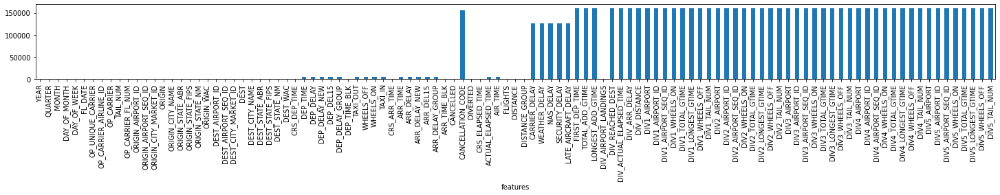

<AxesSubplot:xlabel='features'>

In [0]:
# Visualizing Nulls in Flight Data using the missing_values helper function
df_airlines_eda_missing = missing_values(df_airlines_eda)

df_flights_sample_missing_counts = pd.DataFrame({
    "features": list(df_airlines_eda_missing.columns),
    "number_of_nulls": list(df_airlines_eda_missing.iloc[0])})

df_flights_sample_missing_counts.set_index("features",drop=True,inplace=True)
ax = df_flights_sample_missing_counts.plot.bar(figsize=(25,2))
ax.get_legend().remove()
plt.axes(ax)

From the above analysis and plotting, it can be clearly seen that the columns towards right have mostly null values and can be filtered out from the Airlines dataset.

Also, with the help of stats result above, just by looking at the %missing values, it is clear that most of the features are unnecessary and that would not help in the predictions and eventually not be helpful in meeting our business goal. We decided to filter out all the features with missing % > 5.0. (see Data preparation - step 1 below)

Just by looking at the missing values for all the features, out of 109 features available in the `flights` dataset, 56 features have Missing % > 5.0. As a result we are using 53 features from the airline dataset.

**Data preparation steps:**

1) Remove features on diversion, div2, 3, 4 and 5. Any diverted flight adds more to delay and since we are only considering whether a flight is delayed by more than 15 minutes or not, it is safe to remove these diversion features.

2) In order to compensate for the removed features on diversion, we added diverted flight delays into the arrival delay. Cancellations were added as delays into the outcome variable, with a separate indicator variable.

2) Remove alternative names for airlines carriers, airports, cities, FIPS and states, wac, aiport landings 

3) Remove some features related to arrival since the main goal here is to predict the flight departure

Post processing or after filtering out the unnecessary features, we are proceeding with 38 final features in flights data that we think will be useful in the predictions.These features will also be used for joining with other datasets.

In [0]:
# Data Preparation STEP 1 - removed features (missing % > 5, not useful for predicting delays, and duplicate records) from flights dataset

df_airlines_clean = df_airlines_eda.select("YEAR",
                                              "QUARTER",
                                              "MONTH",
                                              "DAY_OF_MONTH",
                                              "DAY_OF_WEEK",
                                              "FL_DATE",
                                              "OP_UNIQUE_CARRIER",
                                              "TAIL_NUM",
                                              "ORIGIN_AIRPORT_ID",
                                              "ORIGIN",
                                              "ORIGIN_CITY_NAME",
                                              "ORIGIN_STATE_ABR",
                                              "DEST_AIRPORT_ID",
                                              "DEST",
                                              "DEST_CITY_NAME",
                                              "DEST_STATE_ABR",
                                              "CRS_DEP_TIME",
                                              "DEP_TIME",
                                              "DEP_DELAY_NEW",
                                              "DEP_DELAY_GROUP",
                                              "CANCELLED",
                                              "DEP_TIME_BLK",
                                              "CRS_ARR_TIME",
                                              "ARR_TIME",
                                              "DIV_ARR_DELAY",
                                              "ARR_DELAY",
                                              "ARR_DELAY_NEW",
                                              "CANCELLATION_CODE",
                                              "DIVERTED",
                                              "CRS_ELAPSED_TIME",
                                              "ACTUAL_ELAPSED_TIME",
                                              "FLIGHTS",
                                              "DISTANCE",
                                              "DISTANCE_GROUP",
                                              "CARRIER_DELAY",
                                              "WEATHER_DELAY",
                                              "NAS_DELAY",
                                              "SECURITY_DELAY",
                                              "LATE_AIRCRAFT_DELAY", 
                                              "DEP_DEL15",
                                              "ARR_DEL15")

# print(df_airlines_clean.count())

df_airlines_clean = df_airlines_clean.dropDuplicates()

# print(df_airlines_clean.count())

df_airlines_eda = df_airlines_clean

# display(df_airlines_eda)


In [0]:
# Data preparation STEP 2

#1) handled time format for "CRS_DEP_TIME" and "FL_DATE", 
#2) added cancellations as delays into the outcome variable "DEP_DELAYED", 
#3) Added diverted flight arrival delays into the arrival delay (negative value of this column would mean early arrival)

df_airlines_eda = df_airlines_eda.withColumn('DEP_DELAYED', when(col('CANCELLED') == "1" , 1).otherwise(col("DEP_DEL15")))

df_airlines_eda = df_airlines_eda.withColumn('DIV_DELAY_ARR', when(col('DIV_ARR_DELAY') != "null", col('DIV_ARR_DELAY')).otherwise(col("ARR_DELAY")))

df_airlines_eda = df_airlines_eda.withColumn('ARR_DELAYED', when(col('ARR_DEL15') != "null", col('ARR_DEL15')).otherwise(when(col('DIV_DELAY_ARR') > 15 , 1).otherwise(0)))

df_airlines_eda = df_airlines_eda.withColumn("len_CRS_DEP_TIME", F.length("CRS_DEP_TIME"))

df_airlines_eda = df_airlines_eda.withColumn('TIME', 
                                             when(col('len_CRS_DEP_TIME') == "1", concat(lit("000"),col("CRS_DEP_TIME")))
                                             .otherwise(when(col('len_CRS_DEP_TIME') == "2", concat(lit("00"),col("CRS_DEP_TIME")))
                                                        .otherwise(when(col('len_CRS_DEP_TIME') == "3", concat(lit("0"), col("CRS_DEP_TIME")))
                                                                   .otherwise(col("CRS_DEP_TIME")))))

df_airlines_eda = df_airlines_eda.select('*', substring(df_airlines_eda.TIME, -2, 4).alias('MINUTES'))

df_airlines_eda = df_airlines_eda.select('*' , to_timestamp(concat(col("FL_DATE"),lit(" "),col("TIME")),"yyyy-MM-dd HHmm").alias('TIMESTAMP'))

# df_airlines_eda = df_airlines_eda.withColumn('NEW_TIMESTAMP', when(col('MINUTES') > "50", col("TIMESTAMP")).otherwise(col("TIMESTAMP")) + F.expr('INTERVAL -1 HOURS'))

df_airlines_eda = df_airlines_eda.withColumn('NEW_TIMESTAMP',  df_airlines_eda.TIMESTAMP + F.expr('INTERVAL -2 HOURS'))

df_airlines_eda = df_airlines_eda.withColumn("HOURLY_TIMESTAMP", F.date_trunc("hour", df_airlines_eda.NEW_TIMESTAMP))

df_airlines_eda = df_airlines_eda.withColumn('PREV_HOURLY_TIMESTAMP', df_airlines_eda.HOURLY_TIMESTAMP + F.expr('INTERVAL -1 HOURS'))

df_airlines_clean = df_airlines_eda

print(f'The clean airlines data has {df_airlines_clean.count()} examples and a total of {len(df_airlines_clean.columns)} features')

The clean airlines data has 161057 examples and a total of 51 features

In [0]:
df_airlines_eda.display()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY_NEW,DEP_DELAY_GROUP,CANCELLED,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,DIV_ARR_DELAY,ARR_DELAY,ARR_DELAY_NEW,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DEP_DEL15,ARR_DEL15,DEP_DELAYED,DIV_DELAY_ARR,ARR_DELAYED,len_CRS_DEP_TIME,TIME,MINUTES,TIMESTAMP,NEW_TIMESTAMP,HOURLY_TIMESTAMP,PREV_HOURLY_TIMESTAMP
2015,1,3,23,1,2015-03-23,AA,N3BNAA,13930,ORD,"Chicago, IL",IL,10721,BOS,"Boston, MA",MA,2005,2345,220.0,12,0.0,2000-2059,2314,254,null,220.0,220.0,null,0.0,129.0,129.0,1.0,867.0,4,20.0,0.0,0.0,0.0,200.0,1.0,1.0,1.0,220.0,1.0,4,2005,05,2015-03-23T20:05:00.000+0000,2015-03-23T18:05:00.000+0000,2015-03-23T18:00:00.000+0000,2015-03-23T17:00:00.000+0000
2015,1,3,30,1,2015-03-30,AA,N466AA,13930,ORD,"Chicago, IL",IL,11298,DFW,"Dallas/Fort Worth, TX",TX,1138,1136,0.0,-1,0.0,1100-1159,1415,1355,null,-20.0,0.0,null,0.0,157.0,139.0,1.0,802.0,4,null,null,null,null,null,0.0,0.0,0.0,-20.0,0.0,4,1138,38,2015-03-30T11:38:00.000+0000,2015-03-30T09:38:00.000+0000,2015-03-30T09:00:00.000+0000,2015-03-30T08:00:00.000+0000
2015,1,3,15,7,2015-03-15,AA,N455AA,13930,ORD,"Chicago, IL",IL,11298,DFW,"Dallas/Fort Worth, TX",TX,1530,1529,0.0,-1,0.0,1500-1559,1803,1754,null,-9.0,0.0,null,0.0,153.0,145.0,1.0,802.0,4,null,null,null,null,null,0.0,0.0,0.0,-9.0,0.0,4,1530,30,2015-03-15T15:30:00.000+0000,2015-03-15T13:30:00.000+0000,2015-03-15T13:00:00.000+0000,2015-03-15T12:00:00.000+0000
2015,1,3,21,6,2015-03-21,AA,N3LHAA,13930,ORD,"Chicago, IL",IL,14908,SNA,"Santa Ana, CA",CA,1930,1926,0.0,-1,0.0,1900-1959,2153,2142,null,-11.0,0.0,null,0.0,263.0,256.0,1.0,1726.0,7,null,null,null,null,null,0.0,0.0,0.0,-11.0,0.0,4,1930,30,2015-03-21T19:30:00.000+0000,2015-03-21T17:30:00.000+0000,2015-03-21T17:00:00.000+0000,2015-03-21T16:00:00.000+0000
2015,1,3,31,2,2015-03-31,AA,N002AA,10397,ATL,"Atlanta, GA",GA,12892,LAX,"Los Angeles, CA",CA,1230,1224,0.0,-1,0.0,1200-1259,1427,1404,null,-23.0,0.0,null,0.0,297.0,280.0,1.0,1947.0,8,null,null,null,null,null,0.0,0.0,0.0,-23.0,0.0,4,1230,30,2015-03-31T12:30:00.000+0000,2015-03-31T10:30:00.000+0000,2015-03-31T10:00:00.000+0000,2015-03-31T09:00:00.000+0000
2015,1,3,4,3,2015-03-04,AA,N3MFAA,13930,ORD,"Chicago, IL",IL,13303,MIA,"Miami, FL",FL,800,756,0.0,-1,0.0,0800-0859,1206,1149,null,-17.0,0.0,null,0.0,186.0,173.0,1.0,1197.0,5,null,null,null,null,null,0.0,0.0,0.0,-17.0,0.0,3,0800,00,2015-03-04T08:00:00.000+0000,2015-03-04T06:00:00.000+0000,2015-03-04T06:00:00.000+0000,2015-03-04T05:00:00.000+0000
2015,1,3,22,7,2015-03-22,AA,N3LUAA,13930,ORD,"Chicago, IL",IL,11278,DCA,"Washington, DC",VA,1715,1711,0.0,-1,0.0,1700-1759,1959,1952,null,-7.0,0.0,null,0.0,104.0,101.0,1.0,612.0,3,null,null,null,null,null,0.0,0.0,0.0,-7.0,0.0,4,1715,15,2015-03-22T17:15:00.000+0000,2015-03-22T15:15:00.000+0000,2015-03-22T15:00:00.000+0000,2015-03-22T14:00:00.000+0000
2015,1,3,29,7,2015-03-29,AA,N3EEAA,13930,ORD,"Chicago, IL",IL,11697,FLL,"Fort Lauderdale, FL",FL,1155,1151,0.0,-1,0.0,1100-1159,1605,1526,null,-39.0,0.0,null,0.0,190.0,155.0,1.0,1182.0,5,null,null,null,null,null,0.0,0.0,0.0,-39.0,0.0,4,1155,55,2015-03-29T11:55:00.000+0000,2015-03-29T09:55:00.000+0000,2015-03-29T09:00:00.000+0000,2015-03-29T08:00:00.000+0000
2015,1,3,20,5,2015-03-20,DL,N308DE,10397,ATL,"Atlanta, GA",GA,11995,GSO,"Greensboro/High Point, NC",NC,1615,1614,0.0,-1,0.0,1600-1659,1732,1720,null,-12.0,0.0,null,0.0,77.0,66.0,1.0,306.0,2,null,null,null,null,null,0.0,0.0,0.0,-12.0,0.0,4,1615,15,2015-03-20T16:15:00.000+0000,2015-03-20T14:15:00.000+0000,2015-03-20T14:00:00.000+0000,2015-03-20T13:00:00.000+0000
2015,1,3,20,5,2015-03-20,DL,N305DQ,10397,ATL,"Atlanta, GA",GA,12441,JAC,"Jackson, WY",WY,950,946,0.0,-1,0.0,0900-0959,1156,1203,null,7.0,7.0,null,0.0,246

**Holiday feature**

Travel during the holidays can have a negative effect on travel delays, for this reason we created a Holiday feature to capture the holiday days, in addition we included a buffer of 1 day before and after the holiday in this feature, since people then to travel before the actual holiday.

In [0]:
df_airlines_eda = df_airlines_eda.withColumn('HOLIDAY', expr("""CASE WHEN FL_DATE in ('2015-01-01', '2015-01-19', '2015-02-16', '2015-05-25', '2015-07-04', '2015-09-07', '2015-10-12' ,'2015-11-11', '2015-11-26', '2015-12-25',
'2016-01-01', '2016-01-18', '2016-02-15', '2016-05-30', '2016-07-04', '2016-09-05', '2016-10-10',
'2016-11-11', '2016-11-24', '2016-12-25', '2017-01-02', '2017-01-16', '2017-02-20', '2017-05-29', 
'2017-07-04', '2017-09-04', '2017-10-09', '2017-11-11', '2017-11-23', '2017-12-25', '2018-01-02', 
'2018-01-15', '2018-02-19', '2018-05-28', '2018-07-04', '2018-09-03', '2018-10-08', '2018-11-11', 
'2018-11-22', '2018-12-25', '2019-01-02', '2019-01-21', '2019-02-18', '2019-05-27', '2019-07-04', 
'2019-09-02', '2019-10-14', '2019-11-11', '2019-11-28', '2019-12-25') THEN '1' """ + 
""" WHEN FL_DATE in ('2015-01-02', '2015-01-18', '2015-01-20', '2015-02-15', '2015-02-17', 
                    '2015-05-24', '2015-05-26', '2015-07-03', '2015-07-05', '2015-09-06', '2015-09-08', 
                    '2015-10-11', '2015-10-13', '2015-11-10', '2015-11-12', '2015-11-25', '2015-11-27', 
                    '2015-12-24', '2015-12-26',
                    '2015-01-31', '2016-01-02', '2016-01-17', '2016-01-19', '2016-02-14', '2016-02-16', 
                    '2016-05-29', '2016-06-01', '2016-07-03', '2016-07-05', '2016-09-04', '2016-09-06', 
                    '2016-10-09', '2016-10-11', '2016-11-10', '2016-11-12', '2016-11-23', '2016-11-25',
                    '2016-12-24', '2016-12-26',
                    '2017-01-01', '2017-01-03', '2017-01-15', '2017-01-17', '2017-02-19', '2017-02-21', 
                    '2017-05-28', '2017-05-30', '2017-07-03', '2017-07-05', '2017-09-03', '2017-09-05',
                    '2017-10-08', '2017-10-10', '2017-11-10', '2017-11-12', '2017-11-22', '2017-11-24',
                    '2017-12-24', '2017-12-26',
                    '2018-01-01', '2018-01-03', '2018-01-14', '2018-01-16', '2018-02-18', '2018-02-20', 
                    '2018-05-27', '2018-05-29', '2018-07-03', '2018-07-05', '2018-09-02', '2018-09-04', 
                    '2018-10-07', '2018-10-09', '2018-11-10', '2018-11-12', '2018-11-21', '2018-11-23',
                    '2018-12-24', '2018-12-26',
                    '2019-01-01', '2019-01-03', '2019-01-20', '2019-01-22', '2019-02-17', '2019-02-19', 
                    '2019-05-26', '2019-05-28', '2019-07-03', '2019-07-05', '2019-09-01', '2019-09-03', 
                    '2019-10-13', '2019-10-15', '2019-11-10', '2019-11-12', '2019-11-27', '2019-11-29', 
                    '2019-12-24', '2019-12-26') THEN '1' """ + 
""" WHEN DAY_OF_WEEK in ('1', '5') THEN '1' """
"ELSE '0' END"))


**Flight delays due to late arrival of aircraft from a previous flight**

Flight delays can have a snowball effect on other flights. For this reason, we decided to incorporate a `pev_dep_delayed_confirmed` (previous departure delayed confirmed) feature. To achive this task, a window funcion was used based on the tail number and planned arrival time to previous flight information, such as `PLANNED_PREV_ARR`, `PREV_DEP_DELAYED`, `PREV_DEP_TIME`, and `PREV_ORIGIN` features. Some addtional features and conversions were done to achive this task, for example capturing the schedule departure and arrival time of each flight, and converting local times to UTC time. The actual incorporation of the `pev_dep_delayed_confirmed` feature was done in Section 4.2 after the AirportStation - Airline datasets were joined.

In [0]:
# Arrival time (local time) and flight date conversion to UTC
df_airlines_eda = df_airlines_eda.withColumn("len_ARR_TIME", F.length("CRS_ARR_TIME"))

df_airlines_eda = df_airlines_eda.withColumn('A_TIME', 
                                             when(col('len_ARR_TIME') == "1", concat(lit("000"),col("CRS_ARR_TIME")))
                                             .otherwise(when(col('len_ARR_TIME') == "2", concat(lit("00"),col("CRS_ARR_TIME")))
                                                        .otherwise(when(col('len_ARR_TIME') == "3", concat(lit("0"), col("CRS_ARR_TIME")))
                                                                   .otherwise(col("CRS_ARR_TIME")))))

df_airlines_eda = df_airlines_eda.select('*' , to_timestamp(concat(col("FL_DATE"),lit(" "),col("A_TIME")),"yyyy-MM-dd HHmm").alias('PLANNED_ARRIVAL_TIMESTAMP'))

display(df_airlines_eda.limit(10))

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY_NEW,DEP_DELAY_GROUP,CANCELLED,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,DIV_ARR_DELAY,ARR_DELAY,ARR_DELAY_NEW,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DEP_DEL15,ARR_DEL15,DEP_DELAYED,DIV_DELAY_ARR,ARR_DELAYED,len_CRS_DEP_TIME,TIME,MINUTES,TIMESTAMP,NEW_TIMESTAMP,HOURLY_TIMESTAMP,PREV_HOURLY_TIMESTAMP,HOLIDAY,len_ARR_TIME,A_TIME,PLANNED_ARRIVAL_TIMESTAMP
2015,1,3,23,1,2015-03-23,AA,N3BNAA,13930,ORD,"Chicago, IL",IL,10721,BOS,"Boston, MA",MA,2005,2345,220.0,12,0.0,2000-2059,2314,254,null,220.0,220.0,null,0.0,129.0,129.0,1.0,867.0,4,20.0,0.0,0.0,0.0,200.0,1.0,1.0,1.0,220.0,1.0,4,2005,05,2015-03-23T20:05:00.000+0000,2015-03-23T18:05:00.000+0000,2015-03-23T18:00:00.000+0000,2015-03-23T17:00:00.000+0000,1,4,2314,2015-03-23T23:14:00.000+0000
2015,1,3,30,1,2015-03-30,AA,N466AA,13930,ORD,"Chicago, IL",IL,11298,DFW,"Dallas/Fort Worth, TX",TX,1138,1136,0.0,-1,0.0,1100-1159,1415,1355,null,-20.0,0.0,null,0.0,157.0,139.0,1.0,802.0,4,null,null,null,null,null,0.0,0.0,0.0,-20.0,0.0,4,1138,38,2015-03-30T11:38:00.000+0000,2015-03-30T09:38:00.000+0000,2015-03-30T09:00:00.000+0000,2015-03-30T08:00:00.000+0000,1,4,1415,2015-03-30T14:15:00.000+0000
2015,1,3,15,7,2015-03-15,AA,N455AA,13930,ORD,"Chicago, IL",IL,11298,DFW,"Dallas/Fort Worth, TX",TX,1530,1529,0.0,-1,0.0,1500-1559,1803,1754,null,-9.0,0.0,null,0.0,153.0,145.0,1.0,802.0,4,null,null,null,null,null,0.0,0.0,0.0,-9.0,0.0,4,1530,30,2015-03-15T15:30:00.000+0000,2015-03-15T13:30:00.000+0000,2015-03-15T13:00:00.000+0000,2015-03-15T12:00:00.000+0000,0,4,1803,2015-03-15T18:03:00.000+0000
2015,1,3,21,6,2015-03-21,AA,N3LHAA,13930,ORD,"Chicago, IL",IL,14908,SNA,"Santa Ana, CA",CA,1930,1926,0.0,-1,0.0,1900-1959,2153,2142,null,-11.0,0.0,null,0.0,263.0,256.0,1.0,1726.0,7,null,null,null,null,null,0.0,0.0,0.0,-11.0,0.0,4,1930,30,2015-03-21T19:30:00.000+0000,2015-03-21T17:30:00.000+0000,2015-03-21T17:00:00.000+0000,2015-03-21T16:00:00.000+0000,0,4,2153,2015-03-21T21:53:00.000+0000
2015,1,3,31,2,2015-03-31,AA,N002AA,10397,ATL,"Atlanta, GA",GA,12892,LAX,"Los Angeles, CA",CA,1230,1224,0.0,-1,0.0,1200-1259,1427,1404,null,-23.0,0.0,null,0.0,297.0,280.0,1.0,1947.0,8,null,null,null,null,null,0.0,0.0,0.0,-23.0,0.0,4,1230,30,2015-03-31T12:30:00.000+0000,2015-03-31T10:30:00.000+0000,2015-03-31T10:00:00.000+0000,2015-03-31T09:00:00.000+0000,0,4,1427,2015-03-31T14:27:00.000+0000
2015,1,3,4,3,2015-03-04,AA,N3MFAA,13930,ORD,"Chicago, IL",IL,13303,MIA,"Miami, FL",FL,800,756,0.0,-1,0.0,0800-0859,1206,1149,null,-17.0,0.0,null,0.0,186.0,173.0,1.0,1197.0,5,null,null,null,null,null,0.0,0.0,0.0,-17.0,0.0,3,0800,00,2015-03-04T08:00:00.000+0000,2015-03-04T06:00:00.000+0000,2015-03-04T06:00:00.000+0000,2015-03-04T05:00:00.000+0000,0,4,1206,2015-03-04T12:06:00.000+0000
2015,1,3,22,7,2015-03-22,AA,N3LUAA,13930,ORD,"Chicago, IL",IL,11278,DCA,"Washington, DC",VA,1715,1711,0.0,-1,0.0,1700-1759,1959,1952,null,-7.0,0.0,null,0.0,104.0,101.0,1.0,612.0,3,null,null,null,null,null,0.0,0.0,0.0,-7.0,0.0,4,1715,15,2015-03-22T17:15:00.000+0000,2015-03-22T15:15:00.000+0000,2015-03-22T15:00:00.000+0000,2015-03-22T14:00:00.000+0000,0,4,1959,2015-03-22T19:59:00.000+0000
2015,1,3,29,7,2015-03-29,AA,N3EEAA,13930,ORD,"Chicago, IL",IL,11697,FLL,"Fort Lauderdale, FL",FL,1155,1151,0.0,-1,0.0,1100-1159,1605,1526,null,-39.0,0.0,null,0.0,190.0,155.0,1.0,1182.0,5,null,null,null,null,null,0.0,0.0,0.0,-39.0,0.0,4,1155,55,2015-03-29T11:55:00.000+0000,2015-03-29T09:55:00.000+0000,2015-03-29T09:00:00.000+0000,2015-03-29T08:00:00.000+0000,0,4,1605,2015-03-29T16:05:00.000+0000
2015,1,3,20,5,2015-03-20,DL,N308DE,10397,ATL,"Atlanta, GA",GA,11995,GSO,"Greensboro/High Point, NC",NC,1615,1614,0.0,-1,0.0,1600-1659,1732,1720,null,-12.0,0.0

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import lag   
from pyspark.sql import functions as F

win_ind = Window.partitionBy('TAIL_NUM').orderBy('PLANNED_ARRIVAL_TIMESTAMP')
# # Get the prior scheduled departure and arrival time of each flight
# # Get whether the previous flight was delayed at departure or not
df_airlines_eda = df_airlines_eda.withColumn('PLANNED_PREV_ARR', F.lag('PLANNED_ARRIVAL_TIMESTAMP',1, None).over(win_ind))\
                                 .withColumn('PREV_DEP_DELAYED', F.lag('DEP_DELAYED',1, None).over(win_ind))\
                                 .withColumn('PREV_DEP_TIME', F.lag('TIMESTAMP',1, None).over(win_ind))\
                                 .withColumn('PREV_ORIGIN', F.lag('ORIGIN',1, None).over(win_ind))
display(df_airlines_eda)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY_NEW,DEP_DELAY_GROUP,CANCELLED,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,DIV_ARR_DELAY,ARR_DELAY,ARR_DELAY_NEW,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DEP_DEL15,ARR_DEL15,DEP_DELAYED,DIV_DELAY_ARR,ARR_DELAYED,len_CRS_DEP_TIME,TIME,MINUTES,TIMESTAMP,NEW_TIMESTAMP,HOURLY_TIMESTAMP,PREV_HOURLY_TIMESTAMP,HOLIDAY,len_ARR_TIME,A_TIME,PLANNED_ARRIVAL_TIMESTAMP,PLANNED_PREV_ARR,PREV_DEP_DELAYED,PREV_DEP_TIME,PREV_ORIGIN
2015,1,1,1,4,2015-01-01,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,700,656,0.0,-1,0.0,0700-0759,852,842,null,-10.0,0.0,null,0.0,112.0,106.0,1.0,594.0,3,null,null,null,null,null,0.0,0.0,0.0,-10.0,0.0,3,0700,00,2015-01-01T07:00:00.000+0000,2015-01-01T05:00:00.000+0000,2015-01-01T05:00:00.000+0000,2015-01-01T04:00:00.000+0000,1,3,0852,2015-01-01T08:52:00.000+0000,null,null,null,null
2015,1,1,2,5,2015-01-02,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,815,807,0.0,-1,0.0,0800-0859,1012,1009,null,-3.0,0.0,null,0.0,117.0,122.0,1.0,594.0,3,null,null,null,null,null,0.0,0.0,0.0,-3.0,0.0,3,0815,15,2015-01-02T08:15:00.000+0000,2015-01-02T06:15:00.000+0000,2015-01-02T06:00:00.000+0000,2015-01-02T05:00:00.000+0000,1,4,1012,2015-01-02T10:12:00.000+0000,2015-01-01T08:52:00.000+0000,0.0,2015-01-01T07:00:00.000+0000,ATL
2015,1,1,7,3,2015-01-07,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,700,710,10.0,0,0.0,0700-0759,852,853,null,1.0,1.0,null,0.0,112.0,103.0,1.0,594.0,3,null,null,null,null,null,0.0,0.0,0.0,1.0,0.0,3,0700,00,2015-01-07T07:00:00.000+0000,2015-01-07T05:00:00.000+0000,2015-01-07T05:00:00.000+0000,2015-01-07T04:00:00.000+0000,0,3,0852,2015-01-07T08:52:00.000+0000,2015-01-02T10:12:00.000+0000,0.0,2015-01-02T08:15:00.000+0000,ATL
2015,1,1,8,4,2015-01-08,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,947,945,0.0,-1,0.0,0900-0959,1146,1144,null,-2.0,0.0,null,0.0,119.0,119.0,1.0,594.0,3,null,null,null,null,null,0.0,0.0,0.0,-2.0,0.0,3,0947,47,2015-01-08T09:47:00.000+0000,2015-01-08T07:47:00.000+0000,2015-01-08T07:00:00.000+0000,2015-01-08T06:00:00.000+0000,0,4,1146,2015-01-08T11:46:00.000+0000,2015-01-07T08:52:00.000+0000,0.0,2015-01-07T07:00:00.000+0000,ATL
2015,1,1,11,7,2015-01-11,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,947,1007,20.0,1,0.0,0900-0959,1146,1213,null,27.0,27.0,null,0.0,119.0,126.0,1.0,594.0,3,3.0,0.0,7.0,0.0,17.0,1.0,1.0,1.0,27.0,1.0,3,0947,47,2015-01-11T09:47:00.000+0000,2015-01-11T07:47:00.000+0000,2015-01-11T07:00:00.000+0000,2015-01-11T06:00:00.000+0000,0,4,1146,2015-01-11T11:46:00.000+0000,2015-01-08T11:46:00.000+0000,0.0,2015-01-08T09:47:00.000+0000,ATL
2015,1,1,13,2,2015-01-13,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,700,652,0.0,-1,0.0,0700-0759,852,846,null,-6.0,0.0,null,0.0,112.0,114.0,1.0,594.0,3,null,null,null,null,null,0.0,0.0,0.0,-6.0,0.0,3,0700,00,2015-01-13T07:00:00.000+0000,2015-01-13T05:00:00.000+0000,2015-01-13T05:00:00.000+0000,2015-01-13T04:00:00.000+0000,0,3,0852,2015-01-13T08:52:00.000+0000,2015-01-11T11:46:00.000+0000,1.0,2015-01-11T09:47:00.000+0000,ATL
2015,1,1,15,4,2015-01-15,AA,N019AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",FL,947,947,0.0,0,0.0,0900-0959,1146,1208,null,22.0,22.0,null,0.0,119.0,141.0,1.0,594.0,3,0.0,0.0,22.0,0.0,0.0,0.0,1.0,0.0,22.0,1.0,3,0947,47,2015-01-15T09:47:00.000+0000,2015-01-15T07:47:00.000+0000,2015-01-15T07:00:00.000+0000,2015-01-15T06:00:00.000+0000,0,4,1146,2015-01-15T11:46:00.000+0000,2015-01-13T08:52:00.000+0000,0.0,2015-01-13T07:00:00.000+0000,ATL
2015,1,1,16,5,2015-01-16,AA,N019AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,856,851,0.0,-1,0.0,0800-0859,1030,1014,null,-16.0,0.0,null,0.0

Let's explore in depth on Flights cleaner dataset for feature selection in our 3 month dataset, not scalable for the full data.

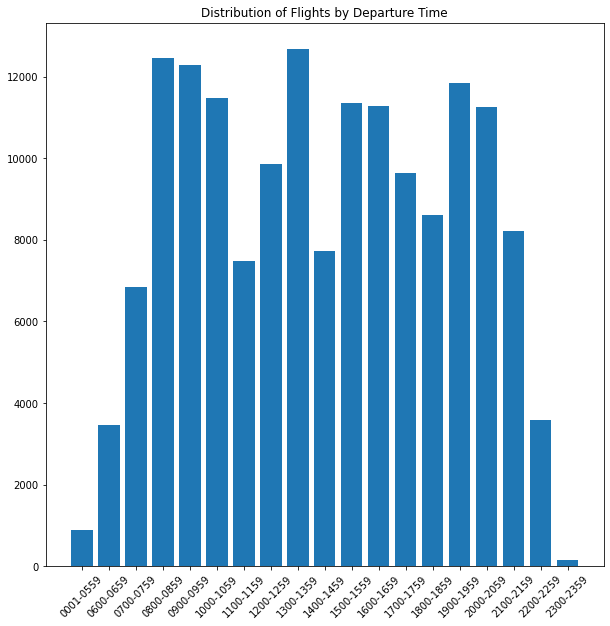

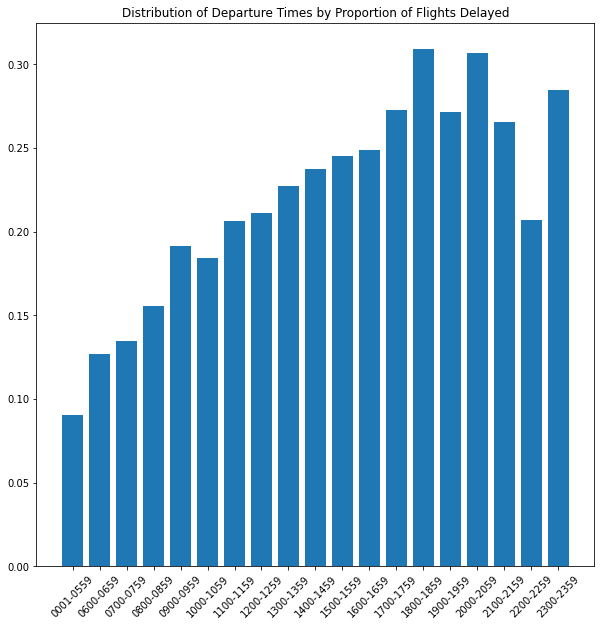

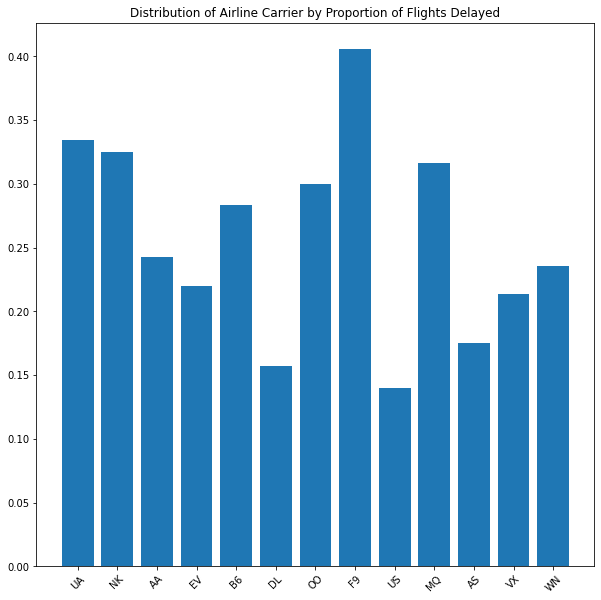

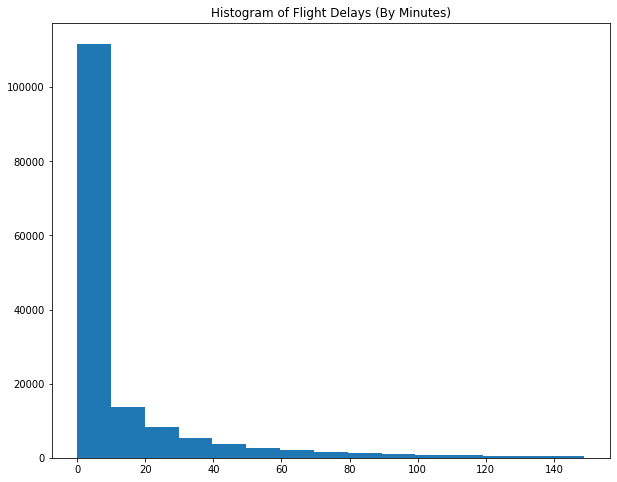

In [0]:
if(not full_data):
  
  #fig, axes = plt.subplots(nrows=2, ncols=2)

  # Distribution of flights by departure time block - hourly intervals (histogram)
  #plt.clf()
  pdDF1 = df_airlines_clean.groupBy("DEP_TIME_BLK").count().orderBy('DEP_TIME_BLK').toPandas()
  plt.figure(figsize=(10,10))
  #pdDF1[['DEP_TIME_BLK', 'count']].plot(ax=axes[0,0], kind='bar')
  plt.bar(pdDF1['DEP_TIME_BLK'], pdDF1['count'])
  plt.xticks(rotation=45)
  plt.title('Distribution of Flights by Departure Time')
  display()

  # Distribution of departure times by the proportion of flights delayed
  Agg_hrblock = df_airlines_clean.groupBy("DEP_TIME_BLK").agg({'DEP_TIME_BLK':'count','DEP_DEL15':'sum'})
  Agg_hrblock = Agg_hrblock.withColumn("Proportion_Delayed",col("sum(DEP_DEL15)")/col('count(DEP_TIME_BLK)'))

  # DEP_TIME_BLK, DEP_DEL15, OP_UNIQUE_CARRIER, DEP_DELAY_NEW

  pdDF2 = Agg_hrblock.toPandas().sort_values('DEP_TIME_BLK')
  #plt.clf()
  plt.figure(figsize=(10,10))
  #pdDF2[['DEP_TIME_BLK', 'Proportion_Delayed']].plot(ax=axes[0,1], kind='bar')
  plt.bar(pdDF2['DEP_TIME_BLK'], pdDF2['Proportion_Delayed'])
  plt.xticks(rotation=45)
  plt.title('Distribution of Departure Times by Proportion of Flights Delayed')
  display()

  # Distribution of airlines by proportion of flights delayed (bar)
  Agg_carrier = df_airlines_clean.groupBy("OP_UNIQUE_CARRIER").agg({'OP_UNIQUE_CARRIER':'count','DEP_DEL15':'sum'})
  Agg_carrier = Agg_carrier.withColumn("Proportion_Delayed",col("sum(DEP_DEL15)")/col('count(OP_UNIQUE_CARRIER)'))

  pdDF3 = Agg_carrier.toPandas()
  plt.figure(figsize=(10,10))
  #pdDF3[['OP_CARRIER', 'Proportion_Delayed']].plot(ax=axes[1,0], kind='bar')
  plt.bar(pdDF3['OP_UNIQUE_CARRIER'], pdDF3['Proportion_Delayed'])
  plt.xticks(rotation=45)
  plt.title('Distribution of Airline Carrier by Proportion of Flights Delayed')
  display()

  # Distribution of flight delays by minutes (histogram)
  #plt.clf()
  pdDF4 = df_airlines_clean.filter(col('DEP_DELAY_NEW') >= 0).filter(col('DEP_DELAY_NEW') <150).toPandas()
  #pdDF4[['DEP_DELAY_NEW']].plot(ax=axes[1,1], kind='hist')
  plt.figure(figsize=(10,8))
  plt.hist(pdDF4['DEP_DELAY_NEW'], bins=15)
  plt.title('Histogram of Flight Delays (By Minutes)')
  display()


Let's write the data to our blob

In [0]:
# df_airlines_clean.write.mode('overwrite').parquet(f"{blob_url}/airlines_3m")

df_airlines_clean = df_airlines_eda
df_airlines_clean.write.mode('overwrite').parquet(f"{blob_url}/airlines_clean_full_window")


Let's read the airlines_clean_full_window data

In [0]:
df_airlines_clean = spark.read.parquet(f"{blob_url}/airlines_clean_full_window/*")

In [0]:
display(df_airlines_clean)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY_NEW,DEP_DELAY_GROUP,CANCELLED,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,DIV_ARR_DELAY,ARR_DELAY,ARR_DELAY_NEW,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DEP_DEL15,ARR_DEL15,DEP_DELAYED,DIV_DELAY_ARR,ARR_DELAYED,len_CRS_DEP_TIME,TIME,MINUTES,TIMESTAMP,NEW_TIMESTAMP,HOURLY_TIMESTAMP,PREV_HOURLY_TIMESTAMP,HOLIDAY,len_ARR_TIME,A_TIME,PLANNED_ARRIVAL_TIMESTAMP,PLANNED_PREV_ARR,PREV_DEP_DELAYED,PREV_DEP_TIME,PREV_ORIGIN
2015,1,1,3,6,2015-01-03,AA,N004AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,800,757,0.0,-1,0.0,0800-0859,930,933,null,3.0,3.0,null,0.0,150.0,156.0,1.0,731.0,3,null,null,null,null,null,0.0,0.0,0.0,3.0,0.0,3,0800,00,2015-01-03T08:00:00.000+0000,2015-01-03T06:00:00.000+0000,2015-01-03T06:00:00.000+0000,2015-01-03T05:00:00.000+0000,0,3,0930,2015-01-03T09:30:00.000+0000,null,null,null,null
2015,1,1,4,7,2015-01-04,AA,N004AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,1640,1636,0.0,-1,0.0,1600-1659,1805,1848,null,43.0,43.0,null,0.0,145.0,192.0,1.0,731.0,3,0.0,0.0,43.0,0.0,0.0,0.0,1.0,0.0,43.0,1.0,4,1640,40,2015-01-04T16:40:00.000+0000,2015-01-04T14:40:00.000+0000,2015-01-04T14:00:00.000+0000,2015-01-04T13:00:00.000+0000,0,4,1805,2015-01-04T18:05:00.000+0000,2015-01-03T09:30:00.000+0000,0.0,2015-01-03T08:00:00.000+0000,ATL
2015,1,1,7,3,2015-01-07,AA,N004AA,13930,ORD,"Chicago, IL",IL,11503,EGE,"Eagle, CO",CO,1145,1323,98.0,6,0.0,1100-1159,1335,1506,null,91.0,91.0,null,0.0,170.0,163.0,1.0,1007.0,5,91.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,91.0,1.0,4,1145,45,2015-01-07T11:45:00.000+0000,2015-01-07T09:45:00.000+0000,2015-01-07T09:00:00.000+0000,2015-01-07T08:00:00.000+0000,0,4,1335,2015-01-07T13:35:00.000+0000,2015-01-04T18:05:00.000+0000,0.0,2015-01-04T16:40:00.000+0000,ATL
2015,1,1,7,3,2015-01-07,AA,N004AA,13930,ORD,"Chicago, IL",IL,11298,DFW,"Dallas/Fort Worth, TX",TX,1845,2015,90.0,6,0.0,1800-1859,2114,2219,null,65.0,65.0,null,0.0,149.0,124.0,1.0,802.0,4,2.0,0.0,0.0,0.0,63.0,1.0,1.0,1.0,65.0,1.0,4,1845,45,2015-01-07T18:45:00.000+0000,2015-01-07T16:45:00.000+0000,2015-01-07T16:00:00.000+0000,2015-01-07T15:00:00.000+0000,0,4,2114,2015-01-07T21:14:00.000+0000,2015-01-07T13:35:00.000+0000,1.0,2015-01-07T11:45:00.000+0000,ORD
2015,1,1,8,4,2015-01-08,AA,N004AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,1047,1038,0.0,-1,0.0,1000-1059,1220,1156,null,-24.0,0.0,null,0.0,153.0,138.0,1.0,731.0,3,null,null,null,null,null,0.0,0.0,0.0,-24.0,0.0,4,1047,47,2015-01-08T10:47:00.000+0000,2015-01-08T08:47:00.000+0000,2015-01-08T08:00:00.000+0000,2015-01-08T07:00:00.000+0000,0,4,1220,2015-01-08T12:20:00.000+0000,2015-01-07T21:14:00.000+0000,1.0,2015-01-07T18:45:00.000+0000,ORD
2015,1,1,8,4,2015-01-08,AA,N004AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,1654,1659,5.0,0,0.0,1600-1659,1825,1828,null,3.0,3.0,null,0.0,151.0,149.0,1.0,731.0,3,null,null,null,null,null,0.0,0.0,0.0,3.0,0.0,4,1654,54,2015-01-08T16:54:00.000+0000,2015-01-08T14:54:00.000+0000,2015-01-08T14:00:00.000+0000,2015-01-08T13:00:00.000+0000,0,4,1825,2015-01-08T18:25:00.000+0000,2015-01-08T12:20:00.000+0000,0.0,2015-01-08T10:47:00.000+0000,ATL
2015,1,1,13,2,2015-01-13,AA,N004AA,10397,ATL,"Atlanta, GA",GA,11298,DFW,"Dallas/Fort Worth, TX",TX,1654,1657,3.0,0,0.0,1600-1659,1825,1843,null,18.0,18.0,null,0.0,151.0,166.0,1.0,731.0,3,0.0,0.0,18.0,0.0,0.0,0.0,1.0,0.0,18.0,1.0,4,1654,54,2015-01-13T16:54:00.000+0000,2015-01-13T14:54:00.000+0000,2015-01-13T14:00:00.000+0000,2015-01-13T13:00:00.000+0000,0,4,1825,2015-01-13T18:25:00.000+0000,2015-01-08T18:25:00.000+0000,0.0,2015-01-08T16:54:00.000+0000,ATL
2015,1,1,15,4,2015-01-15,AA,N004AA,10397,ATL,"Atlanta, GA",GA,13303,MIA,"Miami, FL",

Let's calculate the mean historical delay for the routes, destinations, and origin

**Route delay**

In [0]:
df_airlines_grouped = df_airlines_eda.select("ORIGIN",
                                            "DEST",
                                            "DEP_DELAY_NEW").na.drop()


df_airlines_grouped = df_airlines_grouped.groupBy('ORIGIN','DEST').agg(mean('DEP_DELAY_NEW').alias("route_delay"))


df_airlines_grouped = df_airlines_grouped.selectExpr('ORIGIN as origin_route','DEST as destination_route','route_delay')

# display(df_airlines_grouped)

**Origin delay**

In [0]:
df_airlines_eda = df_airlines_clean
df_airlines_origin = df_airlines_eda.select('ORIGIN', 'DEP_DELAY_NEW', 'ARR_DELAY_NEW').na.drop()

df_airlines_origin = df_airlines_origin.groupBy('ORIGIN').agg(mean('DEP_DELAY_NEW').alias('origin_departure_delay'), mean('ARR_DELAY_NEW').alias('origin_arrival_delay'))

df_airlines_origin = df_airlines_origin.selectExpr('ORIGIN as origin_origin', 'origin_arrival_delay', 'origin_departure_delay' )

# display(df_airlines_origin)

**Destination delay**

In [0]:
df_airlines_dest = df_airlines_eda.select("DEST", "DEP_DELAY_NEW" ,"ARR_DELAY_NEW").na.drop()

df_airlines_dest = df_airlines_dest.groupBy('DEST').agg(mean('DEP_DELAY_NEW').alias('dest_departure_delay'), mean('ARR_DELAY_NEW').alias('dest_arrival_delay'))

df_airlines_dest = df_airlines_dest.selectExpr('DEST as dest_dest','dest_departure_delay','dest_arrival_delay' )

# display(df_airlines_dest)

####Section 3.3 - Airport Dataset

In [0]:
# Explore first 10 rows from weather stations dataset
display(df_airport_codes.limit(10))

# Print schema
print('Data overview')
df_airport_codes.printSchema()

# Print list of columns and data types
print('Columns overview')
pd.DataFrame(df_airport_codes.dtypes, columns = ['Column Name','Data type'])

ID,airport_name,city,country,iata,icao,latitude,longitude,elevation,utc_offset,DST,timezone,type,source
1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689835,145.3919983,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207079887,145.7890015,20,10,U,Pacific/Port_Moresby,airport,OurAirports
3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789856,144.2960052,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380356,147.2200012,146,10,U,Pacific/Port_Moresby,airport,OurAirports
6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.583830118,143.6690063,19,10,U,Pacific/Port_Moresby,airport,OurAirports
7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.16049957,-45.42599869,112,-3,E,America/Godthab,airport,OurAirports
8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.19090271,-51.67810059,283,-3,E,America/Godthab,airport,OurAirports
9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.0122219,-50.71160316,165,-3,E,America/Godthab,airport,OurAirports
10,Thule Air Base,Thule,Greenland,THU,BGTL,76.53119659,-68.70320129,251,-4,E,America/Thule,airport,OurAirports


Data overview
root
-- ID: string (nullable = true)
-- airport_name: string (nullable = true)
-- city: string (nullable = true)
-- country: string (nullable = true)
-- iata: string (nullable = true)
-- icao: string (nullable = true)
-- latitude: string (nullable = true)
-- longitude: string (nullable = true)
-- elevation: string (nullable = true)
-- utc_offset: string (nullable = true)
-- DST: string (nullable = true)
-- timezone: string (nullable = true)
-- type: string (nullable = true)
-- source: string (nullable = true)

Columns overview
Out[100]:

,Column Name,Data type
0,ID,string
1,airport_name,string
2,city,string
3,country,string
4,iata,string
5,icao,string
6,latitude,string
7,longitude,string
8,elevation,string
9,utc_offset,string


In [0]:
# Convert to Pandas datafram
df_airport_codes_pd = df_airport_codes.toPandas()

# Generate dataframe for categorical data
categorical_data = [c for c in df_airport_codes_pd.columns if df_airport_codes_pd.dtypes[c] == 'object']
categorical_df = pd.DataFrame(df_airport_codes_pd[categorical_data])
 
# Get stats for categorical variables
pd.options.display.max_columns = None 
df_airport_codes_details_categorical = get_data_stats_categorical(categorical_df)
display(HTML(df_airport_codes_details_categorical.to_html()))

,Data Types,Counts,Distincts,Nulls,Missing %,Uniques
ID,object,7698,7698,0,0.000000,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, ...]"
airport_name,object,7698,7658,0,0.000000,"[Goroka Airport, Madang Airport, Mount Hagen Kagamuga Airport, Nadzab Airport, Port Moresby Jacksons International Airport, Wewak International Airport, Narsarsuaq Airport, Godthaab / Nuuk Airport, Kangerlussuaq Airport, Thule Air Base, Akureyri Airport, Egilssta_ir Airport, Hornafj�r_ur Airport, H�sav�k Airport, �safj�r_ur Airport, Keflavik International Airport, Patreksfj�r_ur Airport, Reykjavik Airport, Siglufj�r_ur Airport, Vestmannaeyjar Airport, Sault Ste Marie Airport, Winnipeg / St. Andrews Airport, Halifax / CFB Shearwater Heliport, St. Anthony Airport, Tofino / Long Beach Airport, Kugaaruk Airport, Baie Comeau Airport, CFB Bagotville, Baker Lake Airport, Campbell River Airport, Brandon Municipal Airport, Cambridge Bay Airport, Nanaimo Airport, Castlegar/West Kootenay Regional Airport, Miramichi Airport, Charlo Airport, Kugluktuk Airport, Coronation Airport, Chilliwack Airport, Clyde River Airport, Coral Harbour Airport, Dawson City Airport, Burwash Airport, Princeton Airport, Deer Lake Airport, Dease Lake Airport, Dauphin Barker Airport, Dawson Creek Airport, Edmonton International Airport, Arviat Airport, Estevan Airport, Edson Airport, Eureka Airport, Inuvik Mike Zubko Airport, Iqaluit Airport, Fredericton Airport, Forestville Airport, Flin Flon Airport, Fort Resolution Airport, Fort Simpson Airport, Kingston Norman Rogers Airport, La Grande Rivi�re Airport, Gasp� (Michel-Pouliot) Airport, Geraldton Greenstone Regional Airport, �les-de-la-Madeleine Airport, Hudson Bay Airport, Dryden Regional Airport, Ulukhaktok Holman Airport, Gjoa Haven Airport, John C. Munro Hamilton International Airport, Montr�al / Saint-Hubert Airport, Hay River / Merlyn Carter Airport, Halifax / Stanfield International Airport, Atikokan Municipal Airport, Pond Inlet Airport, St Jean Airport, Stephenville Airport, Kamloops Airport, Waterloo Airport, Schefferville Airport, Kindersley Airport, Buttonville Municipal Airport, Chapleau Airport, Meadow Lake Airport, Lloydminster Airport, Alert Airport, Kelowna International Airport, Mayo Airport, Moose Jaw Air Vice Marshal C. M. McEwen Airport, Fort McMurray Airport, Moosonee Airport, Maniwaki Airport, Montreal International (Mirabel) Airport, Natashquan Airport, Ottawa / Gatineau Airport, Matagami Airport, Old Crow Airport, CFB Cold Lake, High Level Airport, Ottawa Macdonald-Cartier International Airport, ...]"
city,object,7649,6956,49,0.636529,"[Goroka, Madang, Mount Hagen, Nadzab, Port Moresby, Wewak, Narssarssuaq, Godthaab, Sondrestrom, Thule, Akureyri, Egilsstadir, Hofn, Husavik, Isafjordur, Keflavik, Patreksfjordur, Reykjavik, Siglufjordur, Vestmannaeyjar, Sault Sainte Marie, Winnipeg, Halifax, St. Anthony, Tofino, Pelly Bay, Baie Comeau, Bagotville, Baker Lake, Campbell River, Brandon, Cambridge Bay, Nanaimo, Castlegar, Chatham, Charlo, Coppermine, Coronation, Chilliwack, Clyde River, Coral Harbour, Dawson, Burwash, Princeton, Deer Lake, Dease Lake, Dauphin, Dawson Creek, Edmonton, Eskimo Point, Estevan, Edson, Eureka, Inuvik, Iqaluit, Fredericton, Forestville, Flin Flon, Fort Resolution, Fort Simpson, Kingston, La Grande Riviere, Gaspe, Geraldton, Iles De La Madeleine, Hudson Bay, Dryden, Holman Island, Gjoa Haven, Hamilton, Montreal, Hay River, Atikokan, Pond Inlet, St. Jean, Stephenville, Kamloops, Waterloo, Schefferville, Kindersley, Toronto, Chapleau, Meadow Lake, Lloydminster, Alert, Kelowna, Mayo, Moose Jaw, Fort Mcmurray, Moosonee, Maniwaki, Natashquan, Gatineau, Mata

#### Section 3.4 - Station Dataset

In [0]:
# explore first 10 rows from weather stations dataset
display(df_stations.limit(10))

# Print data overview
print('Data overview')
df_stations.printSchema()

# Print list of columns and data types
print('Columns overview')
pd.DataFrame(df_stations.dtypes, columns = ['Column Name','Data type'])

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


Data overview
root
-- usaf: string (nullable = true)
-- wban: string (nullable = true)
-- station_id: string (nullable = true)
-- lat: double (nullable = true)
-- lon: double (nullable = true)
-- neighbor_id: string (nullable = true)
-- neighbor_name: string (nullable = true)
-- neighbor_state: string (nullable = true)
-- neighbor_call: string (nullable = true)
-- neighbor_lat: double (nullable = true)
-- neighbor_lon: double (nullable = true)
-- distance_to_neighbor: double (nullable = true)

Columns overview
Out[102]:

,Column Name,Data type
0,usaf,string
1,wban,string
2,station_id,string
3,lat,double
4,lon,double
5,neighbor_id,string
6,neighbor_name,string
7,neighbor_state,string
8,neighbor_call,string
9,neighbor_lat,double


Let's count the None, Null, '', isnull, isnan values

In [0]:
# Analyzing None, Null, '', isnull, isnan values
from pyspark.sql.functions import col,isnan,when,count
df2 = df_stations.select([count(when(col(c).contains('None') | \
                            col(c).contains('NULL') | \
                            (col(c) == '' ) | \
                            col(c).isNull() | \
                            isnan(c), c 
                           )).alias(c)
                    for c in df_stations.columns])
df2.show()


+----+----+----------+---+---+-----------+-------------+--------------+-------------+------------+------------+--------------------+
usaf|wban|station_id|lat|lon|neighbor_id|neighbor_name|neighbor_state|neighbor_call|neighbor_lat|neighbor_lon|distance_to_neighbor|
+----+----+----------+---+---+-----------+-------------+--------------+-------------+------------+------------+--------------------+
 0| 0| 0| 0| 0| 0| 0| 0| 0| 0| 0| 0|
+----+----+----------+---+---+-----------+-------------+--------------+-------------+------------+------------+--------------------+

In [0]:
# Let's convert the dataset to a pandas dataframe
df_stations_eda_pd = df_stations.toPandas()

# Get stats for numerical variables
pd.options.display.max_columns = None
df_stations_eda_details = get_data_stats(df_stations_eda_pd)
display(HTML(df_stations_eda_details.to_html()))

,Data Types,Counts,Distincts,Nulls,Missing %,Uniques
usaf,object,5004169,2227,0,0.0,"[690020, 690070, 690140, 700271, 700450, 700630, 700635, 700636, 701046, 701195, 701213, 701486, 701620, 701719, 701745, 701793, 701995, 702060, 702223, 702312, 702495, 702550, 702640, 702647, 702648, 702675, 702695, 702711, 702745, 702750, 702755, 702757, 702913, 702915, 702923, 702986, 703051, 703406, 703650, 703817, 703880, 703886, 704896, 704897, 720122, 720193, 720264, 720294, 720302, 720316, 720342, 720366, 720392, 720397, 720664, 720666, 720668, 720718, 720719, 720721, 720722, 720723, 720726, 720727, 720731, 720743, 720887, 720915, 720917, 720918, 720919, 720921, 720932, 720953, 720964, 720969, 720976, 721036, 722012, 722051, 722067, 722162, 722245, 722266, 722290, 722309, 722320, 722546, 722556, 722585, 722655, 722657, 722675, 722683, 722720, 722726, 722800, 722819, 722822, 722825, ...]"
wban,object,5004169,2228,0,0.0,"[93218, 93217, 93101, 27506, 27512, 27403, 26465, 27405, 26418, 26625, 26638, 26642, 26508, 00490, 26480, 26524, 26628, 26632, 26602, 26555, 26547, 26514, 26414, 26499, 46406, 26484, 96402, 26439, 26560, 26442, 46404, 26444, 46402, 26486, 26440, 26557, 26521, 26546, 25316, 25357, 25315, 25348, 25625, 25515, 00114, 00117, 63827, 53898, 53963, 12984, 53947, 63879, 00128, 00131, 00242, 00244, 00246, 00253, 00254, 00255, 00256, 00257, 00259, 00260, 00261, 00418, 00297, 00305, 00306, 00307, 00308, 00309, 00317, 00331, 00338, 00341, 00345, 00353, 92817, 12841, 93832, 26554, 03882, 13850, 03881, 00432, 12884, 12910, 12925, 93901, 23005, 23041, 23021, 93083, 93063, 93045, 23195, 53989, 63903, 53145, ...]"
station_id,object,5004169,2237,0,0.0,"[69002093218, 69007093217, 69014093101, 70027127506, 70045027512, 70063027403, 70063526465, 70063627405, 70104626418, 70119526625, 70121326638, 70148626642, 70162026508, 70171900490, 70174526480, 70179326524, 70199526628, 70206026632, 70222326602, 70231226555, 70249526547, 70255026514, 70264026414, 70264726499, 70264846406, 70267526484, 70269596402, 70271126439, 70274526560, 70275026442, 70275546404, 70275726444, 70291346402, 70291526486, 70292326440, 70298626557, 70305126521, 70340626546, 70365025316, 70381725357, 70388025315, 70388625348, 70489625625, 70489725515, 72012200114, 72019300117, 72026463827, 72029453898, 72030253963, 72031612984, 72034253947, 72036663879, 72039200128, 72039700131, 72066400242, 72066600244, 72066800246, 72071800253, 72071900254, 72072100255, 72072200256, 72072300257, 72072600259, 72072700260, 72073100261, 72074300418, 72088700297, 72091500305, 72091700306, 72091800307, 72091900308, 72092100309, 72093200317, 72095300331, 72096400338, 72096900341, 72097600345, 72103600353, 72201292817, 72205112841, 72206793832, 72216226554, 72224503882, 72226613850, 72229003881, 72230900432, 72232012884, 72254612910, 72255612925, 72258593901, 72265523005, 72265723041, 72267523021, 72268393083, 72272093063, 72272693045, 72280023195, 72281953989, 72282263903, 72282553145, ...]"
lat,float64,5004169,2028,0,0.0,"[36.0, 36.683, 33.667, 71.333, 70.917, 70.5, 68.479, 70.25, 65.567, 66.25, 69.733, 67.732, 69.367, 66.888, 67.511, 64.999, 64.55, 63.317, 64.935, 62.543, 61.983, 61.977, 63.331, 63.866, 63.391, 63.032, 61.714, 61.812, 61.748, 61.13, 61.437, 60.783, 62.402, 62.709, 63.383, 60.814, 62.183, 60.204, 58.2, 58.192, 56.0, 56.247, 53.967, 48.6, 40.747, 37.064, 33.78, 33.593, 27.779, 35.864, 38.687, 31.056, 39.217, 28.083, 28.6, 27.817, 28.643, 28.433, 29.483, 29.117, 29.467, 28.577, 27.962, 27.283, 26.067, 46.117, 29.433, 29.183, 29.296, 26.833, 28.917, 31.606, 29.248, 30.033, 44.15, 32.333, 43.467, 28.95, 28.545, 30.217, 61.267, 30.212, 32.35, 32.9, 29.25, 29.333, 29.9, 28.367, 32.733, 32.217, 32.233, 33.6, 33.45, 32.633, 33.237, 32.667, 39.294, 31.114, 37.617, 39.733, ...]"
lon,float64,5004169,2142,0,0.0,"[-121.233, -121.767, -117.733, -156.65, -153.25, -149.883, -149.49, -148.333, -144.765, -166.089, -163.017, -164.548, -152.133, -157.162, -148.493, -150.638, -163.007, -168.967, -16

1) **Selecting features** 
 Station data is used to perform joins of the Airport dataset with Station and Weather datasets. We use the 3 features below from the station data:<br>
<br>
- `neighbor_id`
- `neighbor_call`
- `neighbor_name`
<br>
 The column `neighbor_call`and `neighbor_id` from the Station dataset is used to join with Airport dataset on the column `neighbor_call` = `ICAO`. <br>
 Similarly, the column `neighbor_id` from the Station dataset is used to join the Weather dataset on the column `neighbor_id` = `STATION`. <br>
 The column, `neighbor_name` is used as a reference.

2) **Filtering**

 We used distinct values to provide a data dictionary of a list of all the airports stations provided in the dataset.

In [0]:
# Displaying "neighbor_name", "neighbor_id", "neighbor_call" features

df_stations_clean = df_stations.select("neighbor_name", "neighbor_id", "neighbor_call").distinct()

# display
display(df_stations_clean.limit(10))


neighbor_name,neighbor_id,neighbor_call
GULKANA AIRPORT,70271026425,PAGK
KLAWOCK AIRPORT,70389425367,PAKW
STEPHENS COUNTY AIRPORT,72057800176,KBKD
HUTSON FIELD AIRPORT,72086500291,KGAF
QUINCY RGNL-BLDWN FLD ARPT,72443093989,KUIN
AMES MUNICIPAL AIRPORT,72547294989,KAMW
DOOR CO CHERRYLAND AIRPORT,72645804824,KSUE
WINNER REGIONAL AIRPORT,72651894990,KICR
CRYSTAL AIRPORT,72657594960,KMIC
CHESTER COUNTY GO CARLSON AIR,72040800136,KMQS


#### Section 3.5 - Weather Dataset

For weather data, let's look at https://www.ncei.noaa.gov/data/global-hourly/doc/isd-format-document.pdf

Just like the airline data, let's explore weather data just with 3 month data. 
 - Subsetting 3 months data to just Atlanta (ATL) and Chicago (ORD), our two origin airports from the airline dataset

Below steps are for the preliminary analysis of the available datasets, so that the unnecessary features can be identified and filtered out before joining the datasets.

In [0]:
# Read our data
if(not full_data):
  df_weather_eda = df_weather_3m
else:
  df_weather_eda = df_weather

# Print schema
print('Data overview')
df_weather_eda.printSchema()

Data overview
root
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- SOURCE: short (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- QUALITY_CONTROL: string (nullable = true)
-- WND: string (nullable = true)
-- CIG: string (nullable = true)
-- VIS: string (nullable = true)
-- TMP: string (nullable = true)
-- DEW: string (nullable = true)
-- SLP: string (nullable = true)
-- AW1: string (nullable = true)
-- GA1: string (nullable = true)
-- GA2: string (nullable = true)
-- GA3: string (nullable = true)
-- GA4: string (nullable = true)
-- GE1: string (nullable = true)
-- GF1: string (nullable = true)
-- KA1: string (nullable = true)
-- KA2: string (nullable = true)
-- MA1: string (nullable = true)
-- MD1: string (nullable = true)
-- MW1: string (nullable = true)
-- MW2: string (nullable = true)
-- OC1: string (nullable = true)
-- OD1: string (nullable = true)
-- OD2: string (nullable = true)
-- REM: string (nullable = true)
-- EQD: string (nullable = true)
-- AW2: string (nullable = true)
-- AX4: string (nullable = true)
-- GD1: string (nullable = true)
-- AW5: string (nullable = true)
-- GN1: string (nullable = true)
-- AJ1: string (nullable = true)
-- AW3: string (nullable = true)
-- MK1: string (nullable = true)
-- KA4: string (nullable = true)
-- GG3: string (nullable = true)
-- AN1: string (nullable = true)
-- RH1: string (nullable = true)
-- AU5: string (nullable = true)
-- HL1: string (nullable = true)
-- OB1: string (nullable = true)
-- AT8: string (nullable = true)
-- AW7: string (nullable = true)
-- AZ1: string (nullable = true)
-- CH1: string (nullable = true)
-- RH3: string (nullable = true)
-- GK1: string (nullable = true)
-- IB1: string (nullable = true)
-- AX1: string (nullable = true)
-- CT1: string (nullable = true)
-- AK1: string (nullable = true)
-- CN2: string (nullable = true)
-- OE1: string (nullable = true)
-- MW5: string (nullable = true)
-- AO1: string (nullable = true)
-- KA3: string (nullable = true)
-- AA3: string (nullable = true)
-- CR1: string (nullable = true)
-- CF2: string (nullable = true)
-- KB2: string (nullable = true)
-- GM1: string (nullable = true)
-- AT5: string (nullable = true)
-- AY2: string (nullable = true)
-- MW6: string (nullable = true)
-- MG1: string (nullable = true)
-- AH6: string (nullable = true)
-- AU2: string (nullable = true)
-- GD2: string (nullable = true)
-- AW4: string (nullable = true)
-- MF1: string (nullable = true)
-- AA1: string (nullable = true)
-- AH2: string (nullable = true)
-- AH3: string (nullable = true)
-- OE3: string (nullable = true)
-- AT6: string (nullable = true)
-- AL2: string (nullable = true)
-- AL3: string (nullable = true)
-- AX5: string (nullable = true)
-- IB2: string (nullable = true)
-- AI3: string (nullable = true)
-- CV3: string (nullable = true)
-- WA1: string (nullable = true)
-- GH1: string (nullable = true)
-- KF1: string (nullable = true)
-- CU2: string (nullable = true)
-- CT3: string (nullable = true)
-- SA1: string (nullable = true)
-- AU1: string (nullable = true)
-- KD2: string (nullable = true)
-- AI5: string (nullable = true)
-- GO1: string (nullable = true)
-- GD3: string (nullable = true)
-- CG3: string (nullable = true)
-- AI1: string (nullable = true)
-- AL1: string (nullable = true)
-- AW6: string (nullable = true)
-- MW4: string (nullable = true)
-- AX6: string (nullable = true)
-- CV1: string (nullable = true)
-- ME1: string (nullable = true)
-- KC2: string (nullable = true)
-- CN1: string (nullable = true)
-- UA1: string (nullable = true)
-- GD5: string (nullable = true)
-- UG2: string (nullable = true)
-- AT3: string (nullable = true)
-- AT4: string (nullable = true)
-- GJ1: string (nullable = true)
-- MV1: string (nullable = true)
-- GA5: string (nullable = true)
-- CT2: string (nullable = true)


Let's explore our categorical variables

In [0]:
# get stats for categorical variables
pd.options.display.max_columns = None 
df_weather_eda_details_categorical = get_data_stats_categorical(categorical_df)
display(HTML(df_weather_eda_details_categorical.to_html()))

,Data Types,Counts,Distincts,Nulls,Missing %,Uniques
ID,object,7698,7698,0,0.000000,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, ...]"
airport_name,object,7698,7658,0,0.000000,"[Goroka Airport, Madang Airport, Mount Hagen Kagamuga Airport, Nadzab Airport, Port Moresby Jacksons International Airport, Wewak International Airport, Narsarsuaq Airport, Godthaab / Nuuk Airport, Kangerlussuaq Airport, Thule Air Base, Akureyri Airport, Egilssta_ir Airport, Hornafj�r_ur Airport, H�sav�k Airport, �safj�r_ur Airport, Keflavik International Airport, Patreksfj�r_ur Airport, Reykjavik Airport, Siglufj�r_ur Airport, Vestmannaeyjar Airport, Sault Ste Marie Airport, Winnipeg / St. Andrews Airport, Halifax / CFB Shearwater Heliport, St. Anthony Airport, Tofino / Long Beach Airport, Kugaaruk Airport, Baie Comeau Airport, CFB Bagotville, Baker Lake Airport, Campbell River Airport, Brandon Municipal Airport, Cambridge Bay Airport, Nanaimo Airport, Castlegar/West Kootenay Regional Airport, Miramichi Airport, Charlo Airport, Kugluktuk Airport, Coronation Airport, Chilliwack Airport, Clyde River Airport, Coral Harbour Airport, Dawson City Airport, Burwash Airport, Princeton Airport, Deer Lake Airport, Dease Lake Airport, Dauphin Barker Airport, Dawson Creek Airport, Edmonton International Airport, Arviat Airport, Estevan Airport, Edson Airport, Eureka Airport, Inuvik Mike Zubko Airport, Iqaluit Airport, Fredericton Airport, Forestville Airport, Flin Flon Airport, Fort Resolution Airport, Fort Simpson Airport, Kingston Norman Rogers Airport, La Grande Rivi�re Airport, Gasp� (Michel-Pouliot) Airport, Geraldton Greenstone Regional Airport, �les-de-la-Madeleine Airport, Hudson Bay Airport, Dryden Regional Airport, Ulukhaktok Holman Airport, Gjoa Haven Airport, John C. Munro Hamilton International Airport, Montr�al / Saint-Hubert Airport, Hay River / Merlyn Carter Airport, Halifax / Stanfield International Airport, Atikokan Municipal Airport, Pond Inlet Airport, St Jean Airport, Stephenville Airport, Kamloops Airport, Waterloo Airport, Schefferville Airport, Kindersley Airport, Buttonville Municipal Airport, Chapleau Airport, Meadow Lake Airport, Lloydminster Airport, Alert Airport, Kelowna International Airport, Mayo Airport, Moose Jaw Air Vice Marshal C. M. McEwen Airport, Fort McMurray Airport, Moosonee Airport, Maniwaki Airport, Montreal International (Mirabel) Airport, Natashquan Airport, Ottawa / Gatineau Airport, Matagami Airport, Old Crow Airport, CFB Cold Lake, High Level Airport, Ottawa Macdonald-Cartier International Airport, ...]"
city,object,7649,6956,49,0.636529,"[Goroka, Madang, Mount Hagen, Nadzab, Port Moresby, Wewak, Narssarssuaq, Godthaab, Sondrestrom, Thule, Akureyri, Egilsstadir, Hofn, Husavik, Isafjordur, Keflavik, Patreksfjordur, Reykjavik, Siglufjordur, Vestmannaeyjar, Sault Sainte Marie, Winnipeg, Halifax, St. Anthony, Tofino, Pelly Bay, Baie Comeau, Bagotville, Baker Lake, Campbell River, Brandon, Cambridge Bay, Nanaimo, Castlegar, Chatham, Charlo, Coppermine, Coronation, Chilliwack, Clyde River, Coral Harbour, Dawson, Burwash, Princeton, Deer Lake, Dease Lake, Dauphin, Dawson Creek, Edmonton, Eskimo Point, Estevan, Edson, Eureka, Inuvik, Iqaluit, Fredericton, Forestville, Flin Flon, Fort Resolution, Fort Simpson, Kingston, La Grande Riviere, Gaspe, Geraldton, Iles De La Madeleine, Hudson Bay, Dryden, Holman Island, Gjoa Haven, Hamilton, Montreal, Hay River, Atikokan, Pond Inlet, St. Jean, Stephenville, Kamloops, Waterloo, Schefferville, Kindersley, Toronto, Chapleau, Meadow Lake, Lloydminster, Alert, Kelowna, Mayo, Moose Jaw, Fort Mcmurray, Moosonee, Maniwaki, Natashquan, Gatineau, Mata

In [0]:
# Let's display the dataframe
display(df_weather_eda.limit(10))

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

In [0]:
# Using FM-15 - Aviation routine weather report, and
# FM-12 - Report of surface observation form a fixed land station

df_weather_eda_clean = df_weather_eda.select("STATION",
                                              "DATE",
                                              "REPORT_TYPE",
                                              "LATITUDE",
                                              "LONGITUDE",
                                              "NAME",
                                              "WND",
                                              "CIG",
                                              "VIS",
                                              "TMP",
                                              "DEW",
                                              "SLP",
                                              "AW1"  #Liquid precipitation
                                              ).filter(col("REPORT_TYPE").isin("FM-15"))

# display(df_weather_eda_clean.limit(10))
df_weather_eda = df_weather_eda_clean.distinct()

In [0]:
#WND Angle, Quality Check for Angle, (N-Normal, C-Calm) , Speed in Meters/second, Speed Check
# split columns - WND, CIG, VIS, TMP, DEW, SLP, AA1, HL1, AK1, AM1
df = df_weather_eda
df_weather_eda_split = df.select("STATION",
                                 "DATE",
                                 "LATITUDE",
                                 "LONGITUDE",
                                 "NAME",
                                 split(df.WND, ',').alias("split_wnd"),
                                 split(df.CIG, ',').alias("split_cig"),
                                 split(df.VIS, ',').alias("split_vis"),
                                 split(df.TMP, ',').alias("split_tmp"),
                                 split(df.DEW, ',').alias("split_dew"),
                                 split(df.SLP, ',').alias("split_slp"),
                                 split(df.AW1, ',').alias("split_aw1"))
                   

In [0]:
# Add split columns and substitute missing values with null

df2 = df_weather_eda_split
df_weather_clean = df2.select("STATION",
                                "DATE",
                                "LATITUDE",
                                "LONGITUDE",
                                "NAME",
                                handleMissingValues(df2.split_wnd[0], "999").cast(IntegerType()).alias('WND_ANGLE'),
                                handleMissingValues( df2.split_wnd[1], "9").cast(IntegerType()).alias('WND_ANGLE_QC'),
                                df2.split_wnd[2].alias('WND_TYPE'),
                                handleMissingValues(df2.split_wnd[3], "9999").cast(IntegerType()).alias('WND_SPEED'),
                                df2.split_wnd[4].alias('WND_SPEED_QC'),
                                handleMissingValues(df2.split_cig[0], "9999").cast(IntegerType()).alias('CIG_CLOUD_AGL'),
                                df2.split_cig[1].alias('CIG_CLOUD_AGL_QC'),
                                df2.split_cig[2].alias('CIG_METHOD'),
                                df2.split_cig[3].alias('CIG_CAVOK'),
                                handleMissingValues(df2.split_vis[0], "999999").cast(IntegerType()).alias('VIS_DIST'),
                                df2.split_vis[1].alias('VIS_DIST_QC'),
                                df2.split_vis[2].alias('VIS_VAR'),
                                df2.split_vis[3].alias('VIS_VAR_QC'),
                                handleMissingValues(df2.split_tmp[0], "+9999").cast(IntegerType()).alias('TMP_C'),
                                df2.split_tmp[1].alias('TMP_QC'),
                                handleMissingValues(df2.split_dew[0], "+9999").cast(IntegerType()).alias('DEW_C'),
                                df2.split_dew[1].alias('DEW_QC'),
                                handleMissingValues(df2.split_slp[0], "99999").cast(IntegerType()).alias('SLP_P'),
                                df2.split_slp[1].alias('SLP_QC'),
                                df2.split_aw1[0].alias('AW1_0'))
                                             
                                                 
# display(df_weather_clean.limit(10))

Let's now incorporate present weather observations (AW1) that can cause delays:

29 = Blowing or drifting snow or sand, visibility less than 1 km<br>
30 = Fog<br>
31 = Fog or ice fog in patches<br>
34 = Fog or ice fog, has begun or become thicker during the past hour<br>
35 = Fog, depositing rime<br>
42 = Precipitation, heavy<br>
46 = Solid precipitation, heavy<br>
48 = Freezing precipitation, heavy<br>
63 = Rain, not freezing, heavy<br>
66 = Rain, freezing, heavy<br>
68 = Rain or drizzle and snow, moderate or heavy<br>
73 = Snow, heavy<br>
76 = Ice pellets, heavy<br>
83 = Rain showers or intermittent rain, heavy<br>
84 = Rain showers or intermittent rain, violent<br>
87 = Snow showers or intermittent snow, heavy<br>
89 = Hail<br>
94 = Thunderstorm, heavy, with no precipitation<br>
95 = Thunderstorm, heavy, with rain showers and/or snow<br>
96 = Thunderstorm, heavy, with hail<br>
99 = Tornado<br>

Full list of codes can be found [here](https://www.ncei.noaa.gov/data/global-hourly/doc/isd-format-document.pdf)

In [0]:
df_weather_clean = df_weather_clean.withColumn('WEATHER_OBS', expr("""CASE WHEN AW1_0 in ('29', '30', '31', '34', '35', '42', '48', '63', '66', '68', '73', '76', '83', '84', '87', '89', '94', '95', '96', '99') THEN '1' """ "ELSE '0' END"))

#df_weather_clean = df_weather_clean.withColumn('WEATHER_OBS', expr("""CASE WHEN AW1_0 > '5' THEN '1' """ "ELSE '0' END"))

In [0]:
### Truncate Time that will help us with the join
df_weather_clean = df_weather_clean.withColumn("hourly_timestamp_w", F.date_trunc("hour", df_weather_clean.DATE))
# display(df_weather_clean)


### Section 4 - Join

#### Section 4.1 - Join Airport - Stations datasets to get AirportStation dataset

In [0]:
# Let's do the join using icao code and neighbor_call columns
df_join_airportcode_station = df_airport_codes.join(df_stations_clean,df_airport_codes.icao == df_stations_clean.neighbor_call, "inner")
display(df_join_airportcode_station)
print(f'The AirportStations join dataset has {df_join_airportcode_station.count()} records and a total of {len(df_join_airportcode_station.columns)} features')

ID,airport_name,city,country,iata,icao,latitude,longitude,elevation,utc_offset,DST,timezone,type,source,neighbor_name,neighbor_id,neighbor_call
3837,Gulkana Airport,Gulkana,United States,GKN,PAGK,62.1548996,-145.4570007,1586,-9,A,America/Anchorage,airport,OurAirports,GULKANA AIRPORT,70271026425,PAGK
7205,Klawock Airport,Klawock,United States,KLW,PAKW,55.57920074,-133.076004,80,-9,A,America/Anchorage,airport,OurAirports,KLAWOCK AIRPORT,70389425367,PAKW
4229,Stephens County Airport,Breckenridge,United States,BKD,KBKD,32.71900177,-98.89099884,1284,-6,A,America/Chicago,airport,OurAirports,STEPHENS COUNTY AIRPORT,72057800176,KBKD
5774,Quincy Regional Baldwin Field,Quincy,United States,UIN,KUIN,39.94269943,-91.19460297,768,-6,A,America/Chicago,airport,OurAirports,QUINCY RGNL-BLDWN FLD ARPT,72443093989,KUIN
9447,Crystal Airport,Crystal,United States,\N,KMIC,45.06200027,-93.35389709,869,-6,A,America/Chicago,airport,OurAirports,CRYSTAL AIRPORT,72657594960,KMIC
8772,Chester County G O Carlson Airport,Coatesville,United States,CTH,KMQS,39.97900009,-75.8655014,660,-5,A,America/New_York,airport,OurAirports,CHESTER COUNTY GO CARLSON AIR,72040800136,KMQS
9182,Crystal River Airport,Crystal River,United States,\N,KCGC,28.86730003,-82.57129669,9,-5,A,America/New_York,airport,OurAirports,CRYSTAL RIVER AIRPORT,72065500235,KCGC
4017,Blue Grass Airport,Lexington KY,United States,LEX,KLEX,38.03649902,-84.60590363,979,-5,A,America/New_York,airport,OurAirports,BLUE GRASS AIRPORT,72422093820,KLEX
3569,"""Warren """"Bud"""" Woods Palmer Municipal Airport""",Palmer,United States,PAQ,PAAQ,61.594898,-149.08901,242,-9,A,America/Anchorage,airport,OurAirports,PALMER MUNICIPAL AIRPORT,70274025331,PAAQ
3789,Mac Dill Air Force Base,Tampa,United States,MCF,KMCF,27.84930038,-82.52120209,14,-5,A,America/New_York,airport,OurAirports,MAC DILL AFB AIRPORT,74788012810,KMCF


The AirportStations join dataset has 1302 records and a total of 17 features

In [0]:
# Select relevant features
df_join_airportcode_station = df_join_airportcode_station.distinct().select("iata",
                                                                            "icao",
                                                                            "DST",
                                                                            "timezone",
                                                                            "neighbor_name",
                                                                            "neighbor_id")

df_join_airportcode_station.cache()

# display(df_join_airportcode_station)

Out[115]: DataFrame[iata: string, icao: string, DST: string, timezone: string, neighbor_name: string, neighbor_id: string]

#### Section 4.2 - Join AirportStation - Airline datasets to get AirportStationAirline dataset

In [0]:
# Read the data
df_airlines_eda = spark.read.parquet(f"{blob_url}/airlines_clean_full_window/*")

In [0]:
# Let's do the join using iata code and origin columns
df_join_ac_st_airline = df_airlines_eda.join(df_join_airportcode_station,df_join_airportcode_station.iata == df_airlines_eda.ORIGIN,"left").cache()
# display(df_join_ac_st_airline)

In [0]:
# Select relevant features
df_join_ac_st_airline = df_join_ac_st_airline.selectExpr("YEAR as year",
                            "QUARTER as quarter",
                            "MONTH as month",
                            "DAY_OF_WEEK as day_of_week",
                            "HOLIDAY as holiday",
                            "OP_UNIQUE_CARRIER as carrier",
                            "ORIGIN as origin",
                            "DEST as destination",
                            "DEP_DELAY_NEW as departure_delay",
                            "DEP_DEL15 as departure_delay_15",
                            "DEP_DELAYED as departure_delay_boolean",
                            "ARR_DELAYED as arrival_delay_boolean", 
                            "DISTANCE as distance",
                            "DISTANCE_GROUP as distance_group",
                            "TIMESTAMP as actual_timestamp",
                            "HOURLY_TIMESTAMP as hourly_timestamp",
                            "PREV_HOURLY_TIMESTAMP as prev_hourly_timestamp",
                            "icao as icao_origin",
                            "DST as dst_origin",
                            "timezone as timezone_origin",
                            "PLANNED_PREV_ARR as planned_prev_arrival",
                            "PREV_DEP_TIME as previous_departure",                             
                            "PREV_DEP_DELAYED as prev_dep_delayed",
                            "PREV_ORIGIN as prev_origin",
                            "neighbor_id as neighbor_id_origin"
                             )                      



**Flight delays due to late arrival of aircraft from a previous flight (continuation)**

In [0]:
#Get destination timezone for UTC Conversion
df_join_ac_st_airline_2 = df_join_ac_st_airline.join(df_join_airportcode_station,df_join_airportcode_station.iata == df_join_ac_st_airline.destination,"left")
# display(df_join_ac_st_airline_2)

In [0]:
# Select relevant features
df_join_ac_st_airline_2 = df_join_ac_st_airline_2.selectExpr("year",
                            "quarter",
                            "month",
                            "day_of_week",
                            "holiday",
                            "carrier",
                            "origin",
                            "destination",
                            "departure_delay",
                            "departure_delay_15",
                            "departure_delay_boolean",
                            "arrival_delay_boolean", 
                            "distance",
                            "distance_group",
                            "actual_timestamp",
                            "hourly_timestamp",
                            "prev_hourly_timestamp",
                            "icao_origin",
                            "dst_origin",
                            "timezone_origin",
                            "planned_prev_arrival",
                            "previous_departure",                             
                            "prev_dep_delayed",
                            "timezone as timezone_dest",
                            "prev_origin",
                            "neighbor_id_origin"
                             )   

In [0]:
# Get previous origin for timezone and UTC Conversion
df_join_ac_st_airline_3 = df_join_ac_st_airline_2.join(df_join_airportcode_station,df_join_airportcode_station.iata == df_join_ac_st_airline_2.prev_origin,"left")
# display(df_join_ac_st_airline_3)

In [0]:
# Select relevant features
df_join_ac_st_airline_3 = df_join_ac_st_airline_3.selectExpr("year",
                            "quarter",
                            "month",
                            "day_of_week",
                            "holiday",
                            "carrier",
                            "origin",
                            "destination",
                            "departure_delay",
                            "departure_delay_15",
                            "departure_delay_boolean",
                            "arrival_delay_boolean", 
                            "distance",
                            "distance_group",
                            "actual_timestamp",
                            "hourly_timestamp",
                            "prev_hourly_timestamp",
                            "icao_origin",
                            "dst_origin",
                            "timezone_origin",
                            "planned_prev_arrival",
                            "previous_departure",                             
                            "prev_dep_delayed",
                            "timezone_dest",
                            "prev_origin",
                            "timezone as timezone_prev_origin",
                            "neighbor_id_origin"
                             )   

In [0]:
### change some variables to UTC time
df_join_ac_st_airline_3 = df_join_ac_st_airline_3.select('*' ,
                                                         to_utc_timestamp(df_join_ac_st_airline_3.hourly_timestamp,
                                                                          df_join_ac_st_airline_3.timezone_origin).alias('utc_hourly_timestamp'))

df_join_ac_st_airline_3 = df_join_ac_st_airline_3.select('*' ,
                                                         to_utc_timestamp(df_join_ac_st_airline_3.prev_hourly_timestamp, 
                                                                          df_join_ac_st_airline_3.timezone_origin).alias('utc_prev_hourly_timestamp'))

df_join_ac_st_airline_3 = df_join_ac_st_airline_3.select('*' , 
                                                         to_utc_timestamp(df_join_ac_st_airline_3.actual_timestamp, 
                                                                          df_join_ac_st_airline_3.timezone_origin).alias('utc_actual_timestamp'))

df_join_ac_st_airline_3 = df_join_ac_st_airline_3.select('*' ,
                                                         to_utc_timestamp(df_join_ac_st_airline_3.planned_prev_arrival,
                                                                          df_join_ac_st_airline_3.timezone_dest).alias('utc_planned_prev_arrival'))

df_join_ac_st_airline_3 = df_join_ac_st_airline_3.select('*' , 
                                                         to_utc_timestamp(df_join_ac_st_airline_3.previous_departure, 
                                                                                df_join_ac_st_airline_3.timezone_prev_origin).alias('utc_prev_departure'))

# Time of prediction
# new_df_airlines_eda = new_df_airlines_eda.withColumn('time_prediction_utc_time', new_df_airlines_eda.utc_time + F.expr('INTERVAL -2 HOURS'))

display(df_join_ac_st_airline_3)

year,quarter,month,day_of_week,holiday,carrier,origin,destination,departure_delay,departure_delay_15,departure_delay_boolean,arrival_delay_boolean,distance,distance_group,actual_timestamp,hourly_timestamp,prev_hourly_timestamp,icao_origin,dst_origin,timezone_origin,planned_prev_arrival,previous_departure,prev_dep_delayed,timezone_dest,prev_origin,timezone_prev_origin,neighbor_id_origin,utc_hourly_timestamp,utc_prev_hourly_timestamp,utc_actual_timestamp,utc_planned_prev_arrival,utc_prev_departure
2015,1,1,6,0,AA,ATL,DFW,0.0,0.0,0.0,0.0,731.0,3,2015-01-03T08:00:00.000+0000,2015-01-03T06:00:00.000+0000,2015-01-03T05:00:00.000+0000,KATL,A,America/New_York,null,null,null,America/Chicago,null,null,72219013874,2015-01-03T11:00:00.000+0000,2015-01-03T10:00:00.000+0000,2015-01-03T13:00:00.000+0000,null,null
2015,1,1,7,0,AA,ATL,DFW,0.0,0.0,0.0,1.0,731.0,3,2015-01-04T16:40:00.000+0000,2015-01-04T14:00:00.000+0000,2015-01-04T13:00:00.000+0000,KATL,A,America/New_York,2015-01-03T09:30:00.000+0000,2015-01-03T08:00:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-01-04T19:00:00.000+0000,2015-01-04T18:00:00.000+0000,2015-01-04T21:40:00.000+0000,2015-01-03T15:30:00.000+0000,2015-01-03T13:00:00.000+0000
2015,1,1,3,0,AA,ORD,EGE,98.0,1.0,1.0,1.0,1007.0,5,2015-01-07T11:45:00.000+0000,2015-01-07T09:00:00.000+0000,2015-01-07T08:00:00.000+0000,KORD,A,America/Chicago,2015-01-04T18:05:00.000+0000,2015-01-04T16:40:00.000+0000,0.0,America/Denver,ATL,America/New_York,72530094846,2015-01-07T15:00:00.000+0000,2015-01-07T14:00:00.000+0000,2015-01-07T17:45:00.000+0000,2015-01-05T01:05:00.000+0000,2015-01-04T21:40:00.000+0000
2015,1,1,3,0,AA,ORD,DFW,90.0,1.0,1.0,1.0,802.0,4,2015-01-07T18:45:00.000+0000,2015-01-07T16:00:00.000+0000,2015-01-07T15:00:00.000+0000,KORD,A,America/Chicago,2015-01-07T13:35:00.000+0000,2015-01-07T11:45:00.000+0000,1.0,America/Chicago,ORD,America/Chicago,72530094846,2015-01-07T22:00:00.000+0000,2015-01-07T21:00:00.000+0000,2015-01-08T00:45:00.000+0000,2015-01-07T19:35:00.000+0000,2015-01-07T17:45:00.000+0000
2015,1,1,4,0,AA,ATL,DFW,0.0,0.0,0.0,0.0,731.0,3,2015-01-08T10:47:00.000+0000,2015-01-08T08:00:00.000+0000,2015-01-08T07:00:00.000+0000,KATL,A,America/New_York,2015-01-07T21:14:00.000+0000,2015-01-07T18:45:00.000+0000,1.0,America/Chicago,ORD,America/Chicago,72219013874,2015-01-08T13:00:00.000+0000,2015-01-08T12:00:00.000+0000,2015-01-08T15:47:00.000+0000,2015-01-08T03:14:00.000+0000,2015-01-08T00:45:00.000+0000
2015,1,1,4,0,AA,ATL,DFW,5.0,0.0,0.0,0.0,731.0,3,2015-01-08T16:54:00.000+0000,2015-01-08T14:00:00.000+0000,2015-01-08T13:00:00.000+0000,KATL,A,America/New_York,2015-01-08T12:20:00.000+0000,2015-01-08T10:47:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-01-08T19:00:00.000+0000,2015-01-08T18:00:00.000+0000,2015-01-08T21:54:00.000+0000,2015-01-08T18:20:00.000+0000,2015-01-08T15:47:00.000+0000
2015,1,1,2,0,AA,ATL,DFW,3.0,0.0,0.0,1.0,731.0,3,2015-01-13T16:54:00.000+0000,2015-01-13T14:00:00.000+0000,2015-01-13T13:00:00.000+0000,KATL,A,America/New_York,2015-01-08T18:25:00.000+0000,2015-01-08T16:54:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-01-13T19:00:00.000+0000,2015-01-13T18:00:00.000+0000,2015-01-13T21:54:00.000+0000,2015-01-09T00:25:00.000+0000,2015-01-08T21:54:00.000+0000
2015,1,1,4,0,AA,ATL,MIA,0.0,0.0,0.0,1.0,594.0,3,2015-01-15T08:15:00.000+0000,2015-01-15T06:00:00.000+0000,2015-01-15T05:00:00.000+0000,KATL,A,America/New_York,2015-01-13T18:25:00.000+0000,2015-01-13T16:54:00.000+0000,0.0,America/New_York,ATL,America/New_York,72219013874,2015-01-15T11:00:00.000+0000,2015-01-15T10:00:00.000+0000,2015-01-15T13:15:00.000+0000,2015-01-13T23:25:00.000+0000,2015-01-13T21:54:00.000+0000
2015,1,1,7,1,AA,ATL,MIA,0.0,0.0,0.0,0.0,594.0,3,2015-01-18T21:05:00.000+0000,2015-01-18T19:00:00.000+0000,2015-01-18T18:00:00.000+0000,KATL,A,America/New_York,2015-01-15T10:11:00.000+0000,2015-01-15T08:15:00.000+0000,0.0,America/New_York,ATL,America/New_York,72219013874,2015-01-19T00:0

Now that we have all relavant features, let's generate the `prev_dep_delayed_confirmed` feature. This data is already available 2 hours (7200 seconds) before departure and can be used for our flight delay prediction. The previous delay infomation will come from the variable `prev_dep_delayed` (previous departure delay) as a 0 or 1 label. Flights that not meet that criteria (<7200 seconds) will be labeled as 2.

In [0]:
# Scheduled time in minutes between planned arrival and planned departure
df_join_ac_st_airline_4 = df_join_ac_st_airline_3.withColumn('planned_time_between_flights', (unix_timestamp('utc_actual_timestamp')-unix_timestamp('utc_planned_prev_arrival'))/60)

# Previous flight delay information if departure was 2 hours ahead of scheduled departure time, if data is not available it will give it a 2 (which would also represent short flights)
df_join_ac_st_airline_4 = df_join_ac_st_airline_4.withColumn('prev_dep_delayed_confirmed', when(unix_timestamp('utc_actual_timestamp')-unix_timestamp('utc_prev_departure') > "7200" , col('prev_dep_delayed')).otherwise('2'))

# display(df_join_ac_st_airline_4)

In [0]:
# Let's check for null values in the neighbor_id_origin feature
from pyspark.sql.functions import isnan, when, count, col
df_join_ac_st_airline_4.select([count(when(col('neighbor_id_origin').isNull(),True))]).show()


+-----------------------------------------------------------+
count(CASE WHEN (neighbor_id_origin IS NULL) THEN true END)|
+-----------------------------------------------------------+
 0|
+-----------------------------------------------------------+

Let's drop the flights that have no station, weather, and timezone data

In [0]:
# Remove flights with no station, weather and timezone data
df_join_ac_st_airline_4 = df_join_ac_st_airline_4.na.drop(subset=["neighbor_id_origin"])

In [0]:
# Display(df_join_ac_st_airline)
print(f'The AirportStationsAirline join dataset has {df_join_ac_st_airline_4.count()} records and a total of {len(df_join_ac_st_airline_4.columns)} features')

The AirportStationsAirline join dataset has 161057 records and a total of 34 features

In [0]:
# Write data to the blob
df_join_ac_st_airline_4.write.mode('overwrite').parquet(f"{blob_url}/airportstationsairline_window_fix")

#### Section 4.3 - Join AirportStationAirline - Weather datasets to get AirportStationAirlineWeather dataset

In [0]:
# Read data
df_weather_clean = spark.read.parquet(f"{blob_url}/weather_clean_full_window/*")
df_join_ac_st_airline_4 = spark.read.parquet(f"{blob_url}/airportstationsairline_window_fix/*")

Let's join the datasets. We will join the weather dataset twice. The first join will be based on origin/station columns and utc_hourly_timestamp/hourly_timestamp_w. The second join will be based based on origin/station columns and utc_prev_hourly_timestamp/hourly_timestamp_w.
The first join will provide weather conditions right before our prediction. An the second join, the second previous weather conditions before our prediction.

In [0]:
# join
df_join_ac_st_weather = df_join_ac_st_airline_4.join(df_weather_clean, (df_join_ac_st_airline_4.neighbor_id_origin == df_weather_clean.STATION) & (df_join_ac_st_airline_4.utc_hourly_timestamp == df_weather_clean.hourly_timestamp_w),"left")
display(df_join_ac_st_weather)
print(f'The final joined dataset has {df_join_ac_st_weather.count()} examples and a total of {len(df_join_ac_st_weather.columns)} features')

year,quarter,month,day_of_week,holiday,carrier,origin,destination,departure_delay,departure_delay_15,departure_delay_boolean,arrival_delay_boolean,distance,distance_group,actual_timestamp,hourly_timestamp,prev_hourly_timestamp,icao_origin,dst_origin,timezone_origin,planned_prev_arrival,previous_departure,prev_dep_delayed,timezone_dest,prev_origin,timezone_prev_origin,neighbor_id_origin,utc_hourly_timestamp,utc_prev_hourly_timestamp,utc_actual_timestamp,utc_planned_prev_arrival,utc_prev_departure,planned_time_between_flights,prev_dep_delayed_confirmed,STATION,DATE,LATITUDE,LONGITUDE,NAME,WND_ANGLE,WND_ANGLE_QC,WND_TYPE,WND_SPEED,WND_SPEED_QC,CIG_CLOUD_AGL,CIG_CLOUD_AGL_QC,CIG_METHOD,CIG_CAVOK,VIS_DIST,VIS_DIST_QC,VIS_VAR,VIS_VAR_QC,TMP_C,TMP_QC,DEW_C,DEW_QC,SLP_P,SLP_QC,AW1_0,WEATHER_OBS,hourly_timestamp_w
2015,1,1,6,0,AA,ATL,DFW,0.0,0.0,0.0,0.0,731.0,3,2015-01-17T06:45:00.000+0000,2015-01-17T04:00:00.000+0000,2015-01-17T03:00:00.000+0000,KATL,A,America/New_York,2015-01-16T10:11:00.000+0000,2015-01-16T08:15:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-01-17T09:00:00.000+0000,2015-01-17T08:00:00.000+0000,2015-01-17T11:45:00.000+0000,2015-01-16T16:11:00.000+0000,2015-01-16T13:15:00.000+0000,1174.0,0.0,72219013874,2015-01-17T09:52:00.000+0000,33.6301,-84.4418,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",null,null,C,0,5,22000,5,9,N,16093,5,N,5,0,5,-22,5,10234,5,,0,2015-01-17T09:00:00.000+0000
2015,1,2,2,0,DL,ATL,LEX,0.0,0.0,0.0,0.0,304.0,2,2015-02-10T19:39:00.000+0000,2015-02-10T17:00:00.000+0000,2015-02-10T16:00:00.000+0000,KATL,A,America/New_York,2015-02-10T16:09:00.000+0000,2015-02-10T14:55:00.000+0000,0.0,America/New_York,ATL,America/New_York,72219013874,2015-02-10T22:00:00.000+0000,2015-02-10T21:00:00.000+0000,2015-02-11T00:39:00.000+0000,2015-02-10T21:09:00.000+0000,2015-02-10T19:55:00.000+0000,210.0,0.0,72219013874,2015-02-10T22:52:00.000+0000,33.6301,-84.4418,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",340,5,N,46,5,22000,5,9,N,16093,5,N,5,100,5,11,5,10139,5,,0,2015-02-10T22:00:00.000+0000
2015,1,2,2,0,EV,ATL,LNK,0.0,0.0,0.0,0.0,841.0,4,2015-02-10T19:43:00.000+0000,2015-02-10T17:00:00.000+0000,2015-02-10T16:00:00.000+0000,KATL,A,America/New_York,2015-02-10T17:20:00.000+0000,2015-02-10T16:24:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-02-10T22:00:00.000+0000,2015-02-10T21:00:00.000+0000,2015-02-11T00:43:00.000+0000,2015-02-10T23:20:00.000+0000,2015-02-10T21:24:00.000+0000,83.0,0.0,72219013874,2015-02-10T22:52:00.000+0000,33.6301,-84.4418,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",340,5,N,46,5,22000,5,9,N,16093,5,N,5,100,5,11,5,10139,5,,0,2015-02-10T22:00:00.000+0000
2015,1,2,2,0,EV,ATL,GRK,0.0,0.0,0.0,0.0,803.0,4,2015-02-10T19:20:00.000+0000,2015-02-10T17:00:00.000+0000,2015-02-10T16:00:00.000+0000,KATL,A,America/New_York,2015-02-10T15:22:00.000+0000,2015-02-10T15:05:00.000+0000,0.0,America/Chicago,ATL,America/New_York,72219013874,2015-02-10T22:00:00.000+0000,2015-02-10T21:00:00.000+0000,2015-02-11T00:20:00.000+0000,2015-02-10T21:22:00.000+0000,2015-02-10T20:05:00.000+0000,178.0,0.0,72219013874,2015-02-10T22:52:00.000+0000,33.6301,-84.4418,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",340,5,N,46,5,22000,5,9,N,16093,5,N,5,100,5,11,5,10139,5,,0,2015-02-10T22:00:00.000+0000
2015,1,2,2,0,DL,ATL,LAX,4.0,0.0,0.0,0.0,1947.0,8,2015-02-10T19:35:00.000+0000,2015-02-10T17:00:00.000+0000,2015-02-10T16:00:00.000+0000,KATL,A,America/New_York,2015-02-07T23:52:00.000+0000,2015-02-07T21:45:00.000+0000,0.0,America/Los_Angeles,ATL,America/New_York,72219013874,2015-02-10T22:00:00.000+0000,2015-02-10T21:00:00.000+0000,2015-02-11T00:35:00.000+0000,2015-02-08T07:52:00.000+0000,2015-02-08T02:45:00.000+0000,3883.0,0.0,72219013874,2015-02-10T22:52:00.000+0000,33.6301,-84.4418,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",340,5,N,46,5,22000,5,9,N,16093,5,N,5,100,5,11,5,10139,5,,0,2015-02-10T22:00:00.000+0000
2015,1,2,2,0,WN,ATL,MDW,0.0,0.0,0.0,0.0,591.0,3,2015-02-10T19:40:00.0

The final joined dataset has 161057 examples and a total of 61 features

In [0]:
# select relevant features
df_join_ac_st_weather_clean = df_join_ac_st_weather.selectExpr("year",
                            "quarter",
                            "month",
                            "day_of_week",
                            "holiday",
                            "WEATHER_OBS as weather_obs_prev",
                            "carrier",
                            "origin",
                            "destination",
                            "departure_delay",
                            "departure_delay_15",
                            "departure_delay_boolean", #ADDED - considers cancellations and DEP_DELAY_NEW
                            "arrival_delay_boolean", 
                            "distance",
                            "distance_group",
                            "actual_timestamp",
                            "hourly_timestamp",
                            "prev_hourly_timestamp",
                            "utc_hourly_timestamp",
                            "utc_prev_hourly_timestamp",
                            "planned_time_between_flights",
                            "prev_dep_delayed_confirmed",
                            "STATION as weather_station",
                            "WND_ANGLE as wnd_angle_prev",
                            "WND_ANGLE_QC as wnd_angle_qc_prev",
                            "WND_TYPE as wnd_type_prev",
                            "WND_SPEED as wnd_speed_prev",
                            "WND_SPEED_QC as wnd_speed_qc_prev",
                            "CIG_CLOUD_AGL as wnd_cloud_angle_prev",
                            "CIG_CLOUD_AGL_QC as cig_cloud_angle_qc_prev",
                            "CIG_METHOD as cig_method_prev",
                            "CIG_CAVOK as cig_cavok_prev",
                            "VIS_DIST as vis_dist_prev",
                            "VIS_DIST_QC as vis_dist_qc_prev",
                            "VIS_VAR as vis_var_prev",
                            "VIS_VAR_QC as vis_var_qc_prev",
                            "TMP_C as tmp_c_prev",
                            "TMP_QC as tmp_qc_prev",
                            "DEW_C as dew_c_prev",
                            "DEW_QC as dew_qc_prev",
                            "SLP_P as slp_p_prev",
                            "SLP_QC as slp_qc_prev"
                             )                           


# display(df_join_ac_st_weather_clean)

In [0]:
# 2nd join - df_join_ac_st_weather_clean & df_weather_clean to add second previous weather information
df_join_ac_st_weather_clean_2 = df_join_ac_st_weather_clean.join(df_weather_clean, (df_join_ac_st_weather_clean.weather_station == df_weather_clean.STATION) & (df_join_ac_st_weather_clean.utc_prev_hourly_timestamp == df_weather_clean.hourly_timestamp_w),"left")
# display(df_join_ac_st_weather_clean_2)

In [0]:
# Select relevant features
df_join_ac_st_weather_clean_final = df_join_ac_st_weather_clean_2.selectExpr("year",
                            "quarter",
                            "month",
                            "day_of_week",
                            "holiday",
                            "weather_obs_prev",
                            "weather_obs as weather_obs_prev_2",
                            "carrier",
                            "origin",
                            "destination",
                            "departure_delay",
                            "departure_delay_15",
                            "departure_delay_boolean",
                            "arrival_delay_boolean",                                                 
                            "distance",
                            "distance_group",
                            "actual_timestamp",
                            "hourly_timestamp",
                            "prev_hourly_timestamp",
                            "utc_hourly_timestamp",
                            "utc_prev_hourly_timestamp",
                            "planned_time_between_flights",
                            "prev_dep_delayed_confirmed",                                                                 
                            "weather_station",                                       
                            "wnd_angle_prev",
                            "wnd_angle_qc_prev",
                            "wnd_type_prev",
                            "wnd_speed_prev",
                            "wnd_speed_qc_prev",
                            "wnd_cloud_angle_prev",
                            "cig_cloud_angle_qc_prev",
                            "cig_method_prev",
                            "cig_cavok_prev",
                            "vis_dist_prev",
                            "vis_dist_qc_prev",
                            "vis_var_prev",
                            "vis_var_qc_prev",
                            "tmp_c_prev",
                            "tmp_qc_prev",
                            "dew_c_prev",
                            "dew_qc_prev",
                            "slp_p_prev",
                            "slp_qc_prev",                                        
                            "WND_ANGLE as wnd_angle_prev_2",
                            "WND_ANGLE_QC as wnd_angle_qc_prev_2",
                            "WND_TYPE as wnd_type_prev_2",
                            "WND_SPEED as wnd_speed_prev_2",
                            "WND_SPEED_QC as wnd_speed_qc_prev_2",
                            "CIG_CLOUD_AGL as wnd_cloud_angle_prev_2",
                            "CIG_CLOUD_AGL_QC as cig_cloud_angle_qc_prev_2",
                            "CIG_METHOD as cig_method_prev_2",
                            "CIG_CAVOK as cig_cavok_prev_2",
                            "VIS_DIST as vis_dist_prev_2",
                            "VIS_DIST_QC as vis_dist_qc_prev_2",
                            "VIS_VAR as vis_var_prev_2",
                            "VIS_VAR_QC as vis_var_qc_prev_2",
                            "TMP_C as tmp_c_prev_2",
                            "TMP_QC as tmp_qc_prev_2",
                            "DEW_C as dew_c_prev_2",
                            "DEW_QC as dew_qc_prev_2",
                            "SLP_P as slp_p_prev_2",
                            "SLP_QC as slp_qc_prev_2"
                            )

# display(df_join_ac_st_weather_clean_final)

In [0]:
# Checking the final number of records and features in the final joined dataset
print(f'The final joined dataset has {df_join_ac_st_weather_clean_final.count()} examples and a total of {len(df_join_ac_st_weather_clean_final.columns)} features')

The final joined dataset has 161057 examples and a total of 62 features

In [0]:
# Write to Blob Storage

if(not full_data):
  df_join_ac_st_weather_clean_final.write.mode('overwrite').parquet(f"{blob_url}/3m_join")

if(full_data):
  #df_join_ac_st_weather_clean_final.write.mode('overwrite').parquet(f"{blob_url}/full_join")
  df_join_ac_st_weather_clean_final.write.mode('overwrite').parquet(f"{blob_url}/full_join_15_v2") # Using Report type FM_15

### Section 5 - Post Join EDA/Visualizations and prepare for modelling

Now that we have a fully joined dataset over the first quarter of 2015 data from all the 4 datasets, let's plot some visualizations to better understand the data and build some models. 

To start with, the fully joined dataset has a total of 60 features and 218399 records

In [0]:
# Read the joined dataset from Blob

join_data_3m = spark.read.parquet(f"{blob_url}/3m_join/*")

# full_data = spark.read.parquet(f"{blob_url}/full_join_15_v2/*")

# print(f'The final joined dataset has {full_data.count()} examples and a total of {len(full_data.columns)} features')

In [0]:
temp = join_data_3m.join(df_airlines_grouped, (join_data_3m.origin == df_airlines_grouped.origin_route) & (join_data_3m.destination == df_airlines_grouped.destination_route),"left")
temp_2 = temp.join(df_airlines_origin, (temp.origin == df_airlines_origin.origin_origin) ,"left")
temp_3 = temp_2.join(df_airlines_dest, (temp.destination == df_airlines_dest.dest_dest) ,"left")
temp_3 = temp_3.drop ('origin_route', 'destination_route','origin_origin','dest_dest')
# display(temp_3)

In [0]:
#join_data_3m = spark.read.parquet(f"{blob_url}/3m_join/*")

In [0]:
# Write to the blob storage
if(not full_data):
  temp_3.write.mode('overwrite').parquet(f"{blob_url}/3m_join_route_v2")

if(full_data):
  temp_3.write.mode('overwrite').parquet(f"{blob_url}/full_join_route_v2")

In [0]:
plot_data_df = spark.read.parquet(f"{blob_url}/3m_join_route_v2/*")
temp_3 = spark.read.parquet(f"{blob_url}/3m_join_route_v2/*")

#### Departure Delays by Month - for the 3 month dataset

In [0]:
display(temp_3)

year,quarter,month,day_of_week,holiday,weather_obs_prev,weather_obs_prev_2,carrier,origin,destination,departure_delay,departure_delay_15,departure_delay_boolean,arrival_delay_boolean,distance,distance_group,actual_timestamp,hourly_timestamp,prev_hourly_timestamp,utc_hourly_timestamp,utc_prev_hourly_timestamp,planned_time_between_flights,prev_dep_delayed_confirmed,weather_station,wnd_angle_prev,wnd_angle_qc_prev,wnd_type_prev,wnd_speed_prev,wnd_speed_qc_prev,wnd_cloud_angle_prev,cig_cloud_angle_qc_prev,cig_method_prev,cig_cavok_prev,vis_dist_prev,vis_dist_qc_prev,vis_var_prev,vis_var_qc_prev,tmp_c_prev,tmp_qc_prev,dew_c_prev,dew_qc_prev,slp_p_prev,slp_qc_prev,wnd_angle_prev_2,wnd_angle_qc_prev_2,wnd_type_prev_2,wnd_speed_prev_2,wnd_speed_qc_prev_2,wnd_cloud_angle_prev_2,cig_cloud_angle_qc_prev_2,cig_method_prev_2,cig_cavok_prev_2,vis_dist_prev_2,vis_dist_qc_prev_2,vis_var_prev_2,vis_var_qc_prev_2,tmp_c_prev_2,tmp_qc_prev_2,dew_c_prev_2,dew_qc_prev_2,slp_p_prev_2,slp_qc_prev_2,route_delay,origin_arrival_delay,origin_departure_delay,dest_departure_delay,dest_arrival_delay
2015,1,1,5,1,0,0,WN,ATL,LGA,null,null,1.0,0.0,762.0,4,2015-01-09T19:00:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,-40.0,2,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,17.077607513593673,9.430622662316253,10.17300849240004,18.83973172987974,20.11586493987049
2015,1,1,5,1,0,0,DL,ATL,CLT,26.0,1.0,1.0,1.0,226.0,1,2015-01-09T19:35:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,1786.0,1.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,7.132817153067302,9.430622662316253,10.17300849240004,9.890231621349447,10.387378314870762
2015,1,1,5,1,0,0,US,ATL,PHL,0.0,0.0,0.0,0.0,666.0,3,2015-01-09T19:45:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,4202.0,1.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,12.26985111662531,9.430622662316253,10.17300849240004,13.583660644147683,12.445797329143755
2015,1,1,5,1,0,0,WN,ATL,JAX,1.0,0.0,0.0,0.0,270.0,2,2015-01-09T19:00:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,4390.0,1.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,7.66171875,9.430622662316253,10.17300849240004,8.125461254612546,7.660516605166052
2015,1,1,5,1,0,0,DL,ATL,TPA,0.0,0.0,0.0,0.0,406.0,2,2015-01-09T19:35:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,236.0,0.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,9.066139061616733,9.430622662316253,10.17300849240004,12.723668402082499,11.665198237885463
2015,1,1,5,1,0,0,DL,ATL,LAS,7.0,0.0,0.0,0.0,1747.0,7,2015-01-09T19:10:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,4021.0,0.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,8.265625,9.430622662316253,10.17300849240004,14.144444444444444,12.1489898989899
2015,1,1,5,1,0,0,DL,ATL,SNA,26.0,1.0,1.0,0.0,1919.0,8,2015-01-09T19:40:00.000+0000,2015-01-09T17:00:00.000+0000,2015-01-09T16:00:00.000+0000,2015-01-09T22:00:00.000+0000,2015-01-09T21:00:00.000+0000,1035.0,0.0,72219013874,320,5,N,46,5,6096,5,M,N,16093,5,N,5,22,5,-106,5,10275,5,300,5,N,51,5,5486,5,M,N,16093,5,N,5,39,5,-94,5,10268,5,8.594488188976378,9.430622662316253,10.17300849240004,10.69393511

This graphs shows that we have more delays in the month of March. It will be interesting to see the delay distribution with the full dataset.

#### Weather Characteristics - for the 3 month dataset

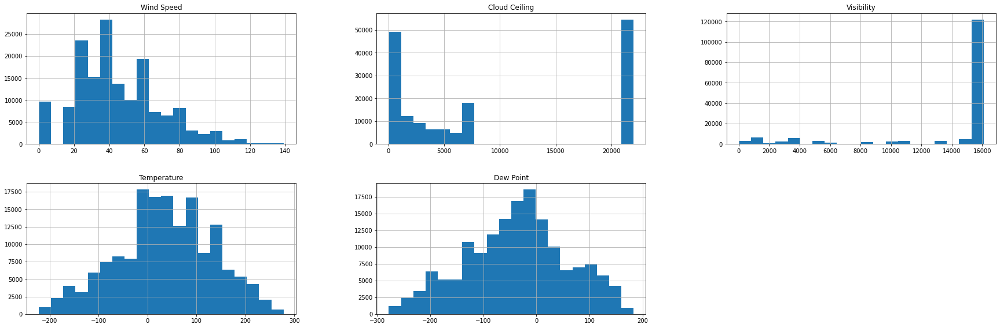

In [0]:
# full_data = False
if(not full_data):
  plot_data_df = plot_data_df.toPandas()
  plot_data_df = plot_data_df.rename(columns = {
    'wnd_speed_prev_2': 'Wind Speed'
    ,'wnd_cloud_angle_prev_2': 'Cloud Ceiling'
    ,'vis_dist_prev_2': 'Visibility'
    ,'tmp_c_prev_2': 'Temperature'
    ,'dew_c_prev_2': 'Dew Point'
  })

  FIELDS = [
            'Wind Speed','Cloud Ceiling','Visibility','Temperature'
            ,'Dew Point'
           ]
  plot_data_df[FIELDS].hist(figsize=(30,15), bins=20, layout=(3,3))
  plt.show()

#### Percentage Departure Delays by Month - for the 3 month dataset

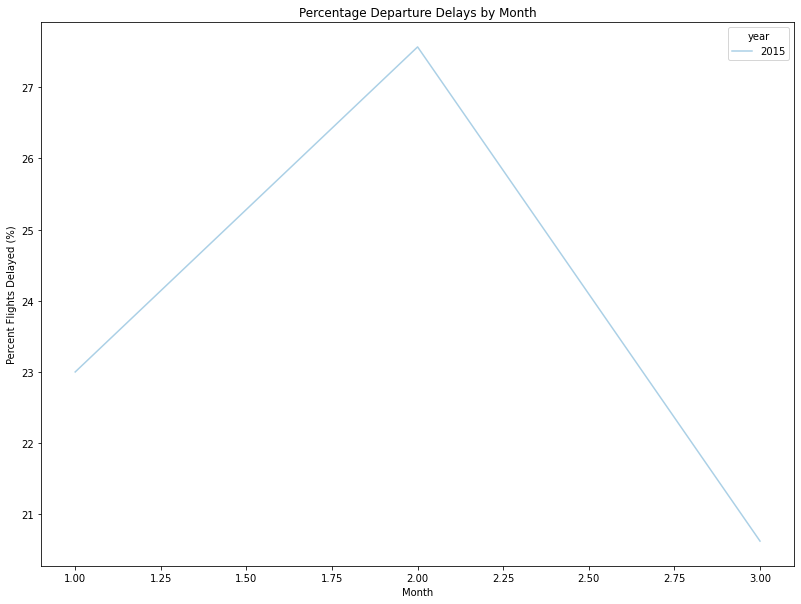

In [0]:
if(not full_data):
  monthly_agg = temp_3.select(['origin', 'year', 'month', 'departure_delay_15', 'departure_delay' ]).dropna(how='any').groupBy('year', 'month')\
          .agg(count('origin').alias('n_flights'),\
               pyspark_sum(when(col('departure_delay_15') == 1, 1).otherwise(0)).alias('n_delayed'),\
               (pyspark_sum(when(col('departure_delay_15') == 1, 1).otherwise(0))/count('departure_delay_15') * 100).alias('pct_origin_dow_delayed'),\
               mean('departure_delay').alias('mean_origin_dow_delay'))\
               .withColumn("sort_order", col('month').cast(IntegerType()))\
               .orderBy(['year', 'sort_order'], ascending=1)

  # convert to pandas for plotting
  plot_monthly_agg = monthly_agg.toPandas()

  plt.figure(figsize=(13.5,10))
  ax = sns.lineplot(data=plot_monthly_agg, y="pct_origin_dow_delayed", x="month", hue="year", palette="Blues_d", ci=None)
  plt.xlabel('Month')
  plt.ylabel('Percent Flights Delayed (%)')
  plt.title('Percentage Departure Delays by Month')
  plt.show()


This graphs incorporates the percentage of flight considering the total amount of flights. The month of March has the greatest number of Percentage Departure Delays by Month.

##### Departure delays by Airport - for the 3 month dataset

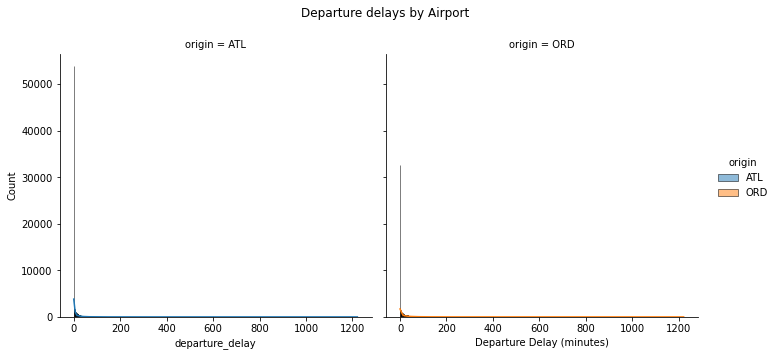

In [0]:
if(not full_data):
  plt.figure(figsize=(13.5,6))
  ax = sns.displot(data=plot_data_df, x="departure_delay", hue="origin", col="origin", linewidth = 0.5, kde=True)
  plt.xlabel('Departure Delay (minutes)')
  plt.subplots_adjust(top=0.85)
  plt.suptitle('Departure delays by Airport')
  plt.show()

The graph shows the departure delays by our two origin airports, since we are just interested in delays greater than 15 minutes. Let's remove the first 15 minutes for the departure delays.

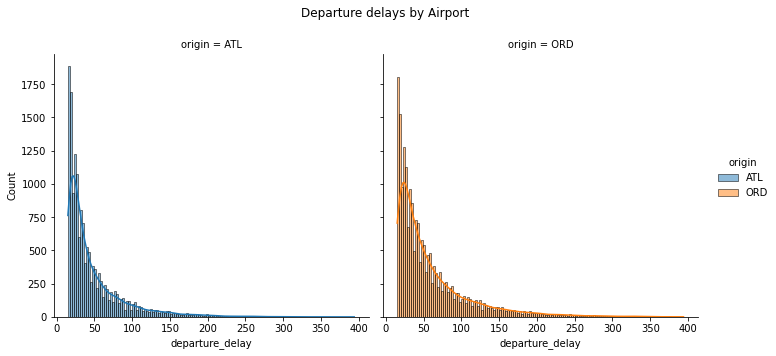

In [0]:
if(not full_data):
  # This plot shows a better view when records over a range of less than 400 and greater than 15, were cropped
  # this plot and the above plot can be combined as a subplot

  plot_subset_3m_df = temp_3.filter(col("departure_delay") >= 15).filter(col("departure_delay") < 400).toPandas()

  plt.figure(figsize=(13.5,6))
  ax = sns.displot(data=plot_subset_3m_df, x="departure_delay", hue="origin", col="origin", linewidth = 0.5, kde=True)
#   plt.xlabel('Departure Delay (minutes)')
  plt.subplots_adjust(top=0.85)
  plt.suptitle('Departure delays by Airport')
  plt.show()


We can observe a similar data distribution in both airports Atlanta (ATL) and Orlando (ORD). With more delays in Chicago (ORD).

##### Departure delays by Carrier, Origin, Month and Day of Week - for the 3 month dataset

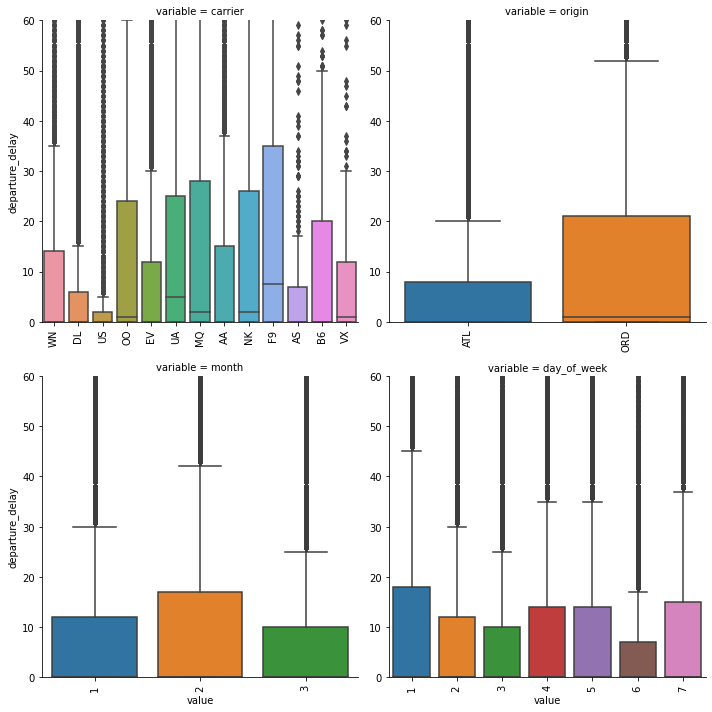

In [0]:
if(not full_data):
  categorical_data = ['carrier', 'origin', 'month' , 'day_of_week']

  def boxplot(x, y, **kwargs):
      sns.boxplot(x=x, y=y)
      x=plt.xticks(rotation=90)
  c = pd.melt(plot_data_df, id_vars=['departure_delay'], value_vars=categorical_data)
  g = sns.FacetGrid(c, col="variable",  col_wrap=2, sharex=False, sharey=False, height=5)
  g.set(ylim=(0, 60))
  g = g.map(boxplot, "value", "departure_delay")

These graphs show departure delays vs carriers, origin airport, by month, and by day of the week (Value of 1 corresponds with the day of Monday).

##### Departure delays by Weekday and Hour - for the 3 month dataset

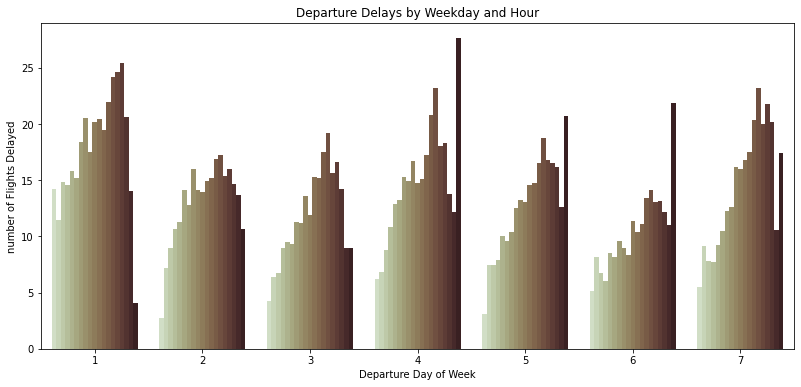

In [0]:
from pyspark.sql.functions import hour

if(not full_data):
  data_df_3m_hr = temp_3.withColumn('hour',hour(temp_3.actual_timestamp))
  plot_data_df_3m_hr = data_df_3m_hr.toPandas()

  plt.figure(figsize=(13.5,6))
  ax = sns.barplot(data=plot_data_df_3m_hr, y="departure_delay", x="day_of_week",
                   hue='hour', palette="ch:.7",
                   ci=None)
  ax.legend_.remove()
  plt.xlabel('Departure Day of Week')
  plt.ylabel('number of Flights Delayed')
  plt.title('Departure Delays by Weekday and Hour')
  plt.show()

Number of flight delays by the day of the week and by the hour of each day. Flight delays are more in the late afternoons/evenings compared to the mornings.